In [85]:
import pandas as pd
import numpy as np
import umap
import matplotlib.pyplot as plt
from sklearn.preprocessing import MultiLabelBinarizer


# Download NLTK data


In [80]:
import json

# Define file paths
train_file = r'C:\Users\ezequ\OneDrive\Documentos\Facultad\data viz\food\get_data\train.json'
test_file = r'C:\Users\ezequ\OneDrive\Documentos\Facultad\data viz\food\get_data\test.json'

# Load JSON data from files
with open(train_file, 'r', encoding='utf-8') as f:
    train_data = json.load(f)

with open(test_file, 'r', encoding='utf-8') as f:
    test_data = json.load(f)

# Convert JSON data to DataFrames
train_df = pd.json_normalize(train_data)
test_df = pd.json_normalize(test_data)

# Merge the DataFrames (concatenation)
recipes_df = pd.concat([train_df, test_df], ignore_index=True)

In [81]:
# Fill NaN values in 'cuisine' with 'Unknown' or another placeholder
recipes_df['cuisine'] = recipes_df['cuisine'].fillna('Unknown')


In [95]:
recipes_df['cuisine'].value_counts()

cuisine
Unknown         9944
italian         7838
mexican         6438
southern_us     4320
indian          3003
chinese         2673
french          2646
cajun_creole    1546
thai            1539
japanese        1423
greek           1175
spanish          989
korean           830
vietnamese       825
moroccan         821
british          804
filipino         755
irish            667
jamaican         526
russian          489
brazilian        467
Name: count, dtype: int64

In [82]:
# Separate known and unknown cuisines if needed
known_cuisine_df = recipes_df[recipes_df['cuisine'] != 'Unknown']
unknown_cuisine_df = recipes_df[recipes_df['cuisine'] == 'Unknown']


In [96]:
# Count the occurrences of each cuisine
cuisine_counts = recipes_df['cuisine'].value_counts()

# Filter for cuisines with counts less than or equal to 3003
filtered_cuisines = cuisine_counts[cuisine_counts <= 3003].index

# Filter the main DataFrame to only include these cuisines
recipes_df = recipes_df[recipes_df['cuisine'].isin(filtered_cuisines)]

# Check the filtered result


In [97]:
# Initialize MultiLabelBinarizer
mlb = MultiLabelBinarizer()

# Fit and transform the ingredients lists
feature_matrix = mlb.fit_transform(recipes_df['ingredients'])

# Get the list of all ingredients
ingredient_names = mlb.classes_

# Confirm the shape of the feature matrix
print("Feature matrix shape:", feature_matrix.shape)
print("Number of unique ingredients:", len(ingredient_names))


Feature matrix shape: (21178, 5328)
Number of unique ingredients: 5328


In [98]:
n_neighbors = 15        # Adjust as needed
min_dist = 0.1          # Adjust as needed
n_components = 2        # 2D visualization
metric = 'jaccard'      # Suitable for binary data
random_state = 42       # For reproducibility


In [99]:
# Initialize UMAP
reducer = umap.UMAP(
    n_neighbors=n_neighbors,
    min_dist=min_dist,
    n_components=n_components,
    metric=metric,
    random_state=random_state
)

# Fit UMAP to the feature matrix
embedding = reducer.fit_transform(feature_matrix)

# Confirm the shape of the embedding
print("Embedding shape:", embedding.shape)


Embedding shape: (21178, 2)


In [89]:
# Create a DataFrame with the UMAP embedding and the 'cuisine' labels
embedding_df = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'])
embedding_df['cuisine'] = recipes_df['cuisine'].values
embedding_df['id'] = recipes_df['id'].values


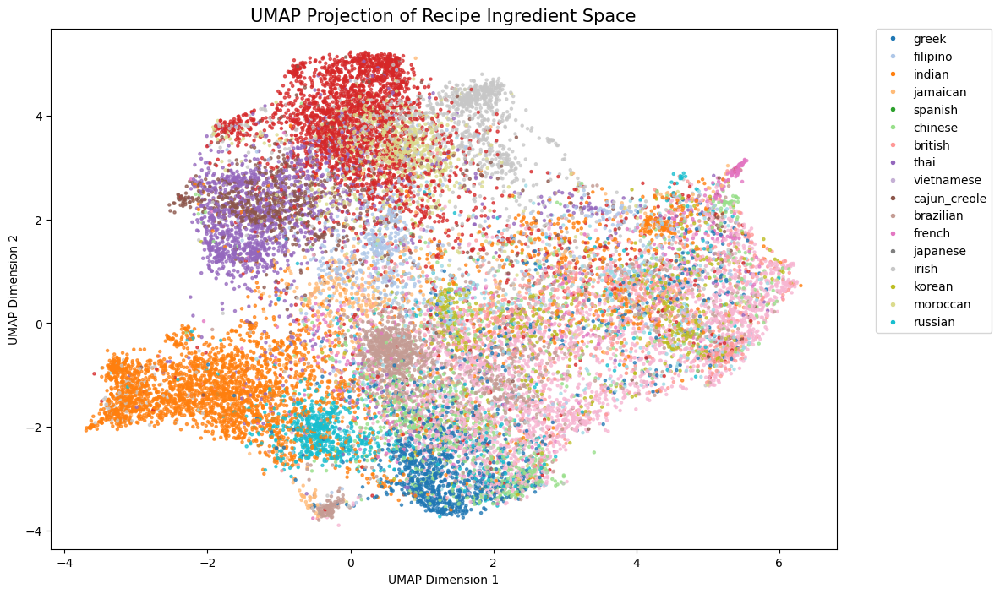

In [101]:
# Optional: Create a color map for cuisines
unique_cuisines = embedding_df['cuisine'].unique()
cuisine_to_color = {cuisine: idx for idx, cuisine in enumerate(unique_cuisines)}
embedding_df['cuisine_color'] = embedding_df['cuisine'].map(cuisine_to_color)

# Plot the embedding
plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    embedding_df['UMAP1'],
    embedding_df['UMAP2'],
    c=embedding_df['cuisine_color'],
    cmap='tab20',
    s=5,
    alpha=0.7
)

# Add a legend with cuisine labels
handles = []
for cuisine, color_idx in cuisine_to_color.items():
    handles.append(
        plt.Line2D(
            [], [], marker='o', color='w', label=cuisine,
            markerfacecolor=plt.cm.tab20(color_idx / len(unique_cuisines)), markersize=5
        )
    )
plt.legend(handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.title('UMAP Projection of Recipe Ingredient Space', fontsize=15)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.show()


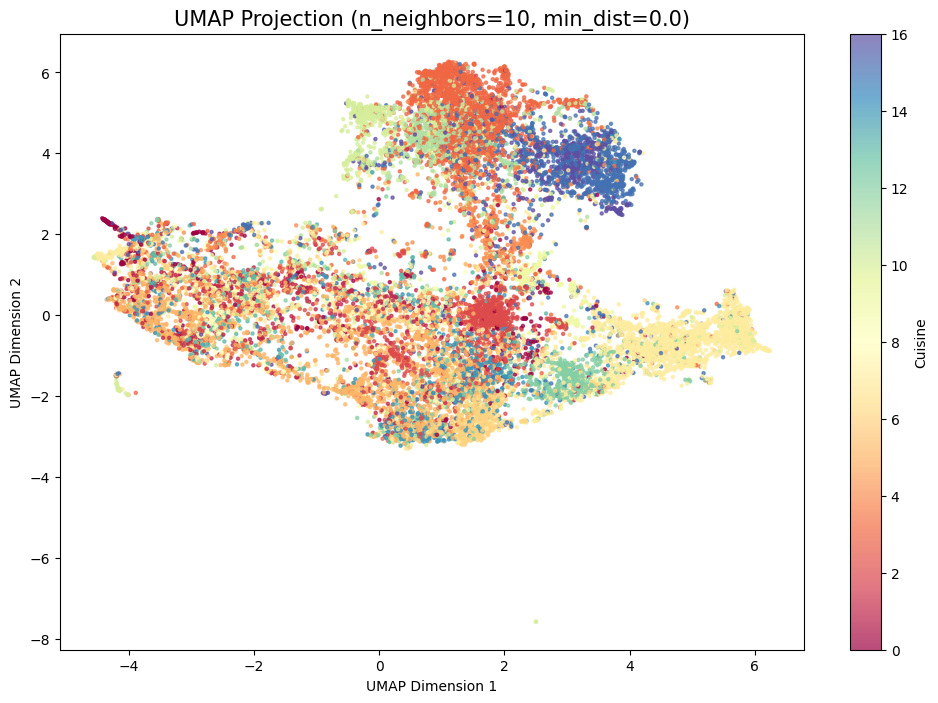

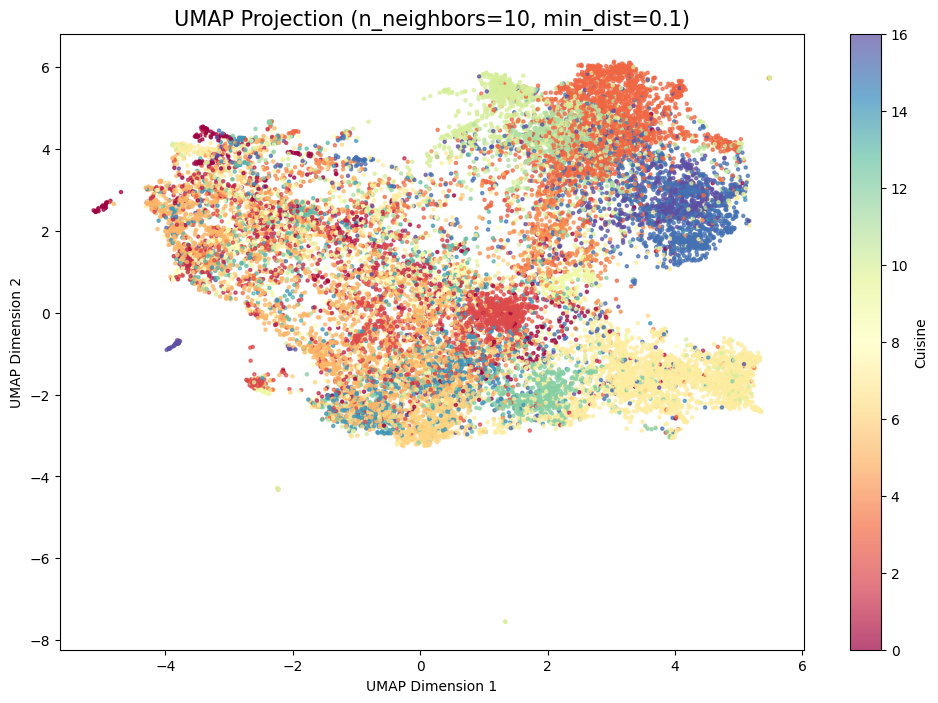

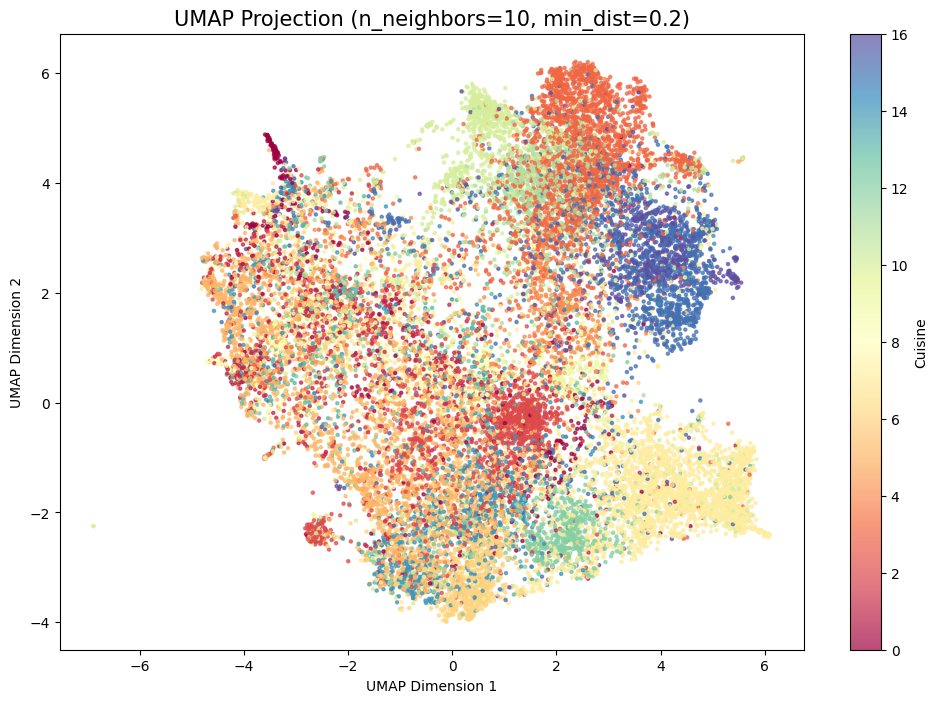

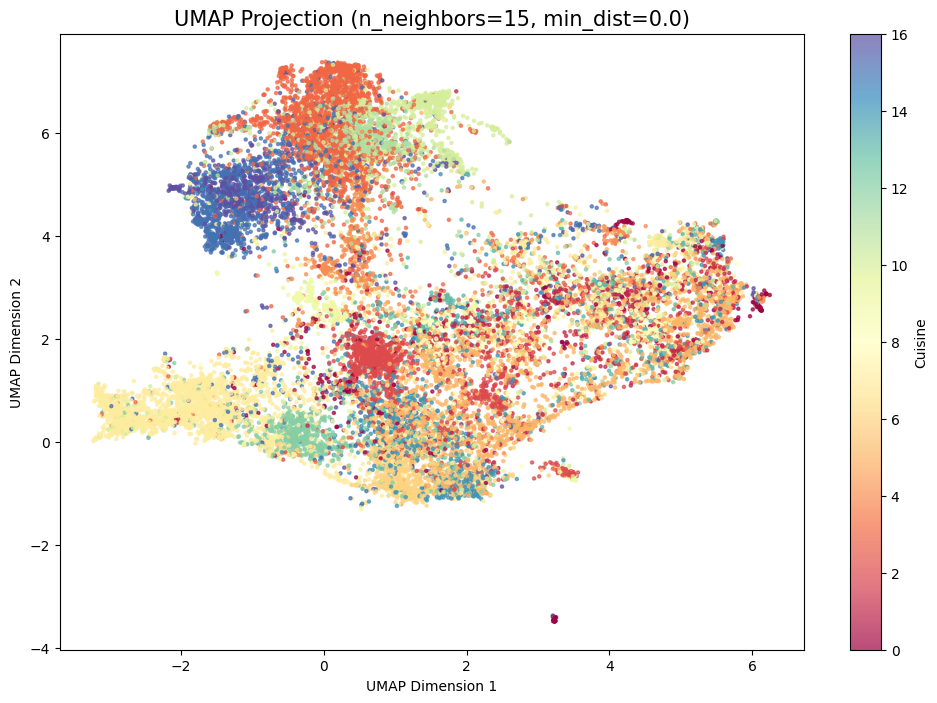

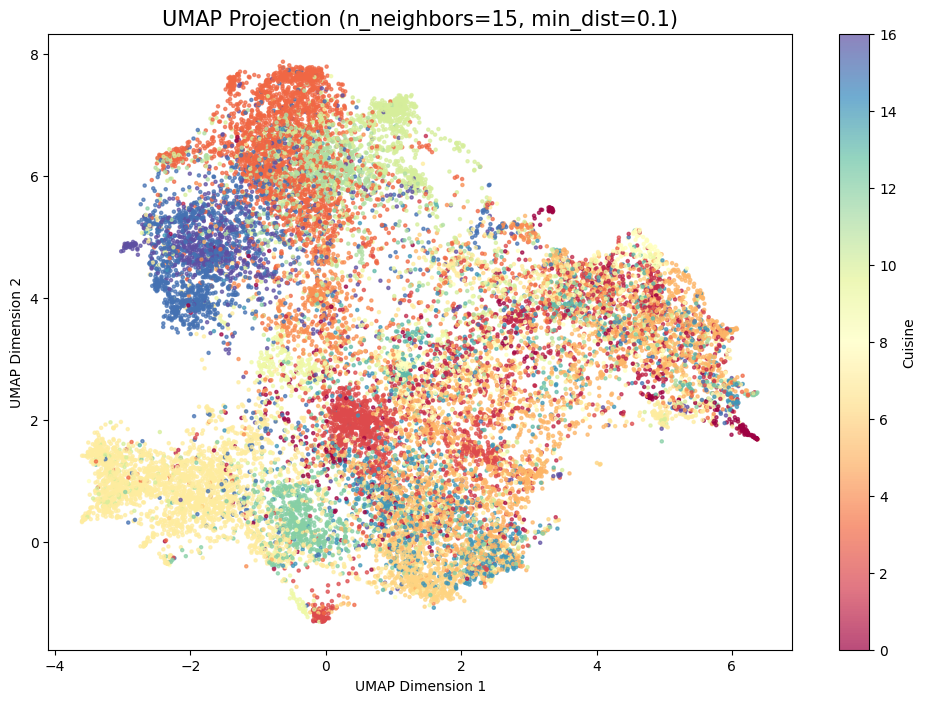

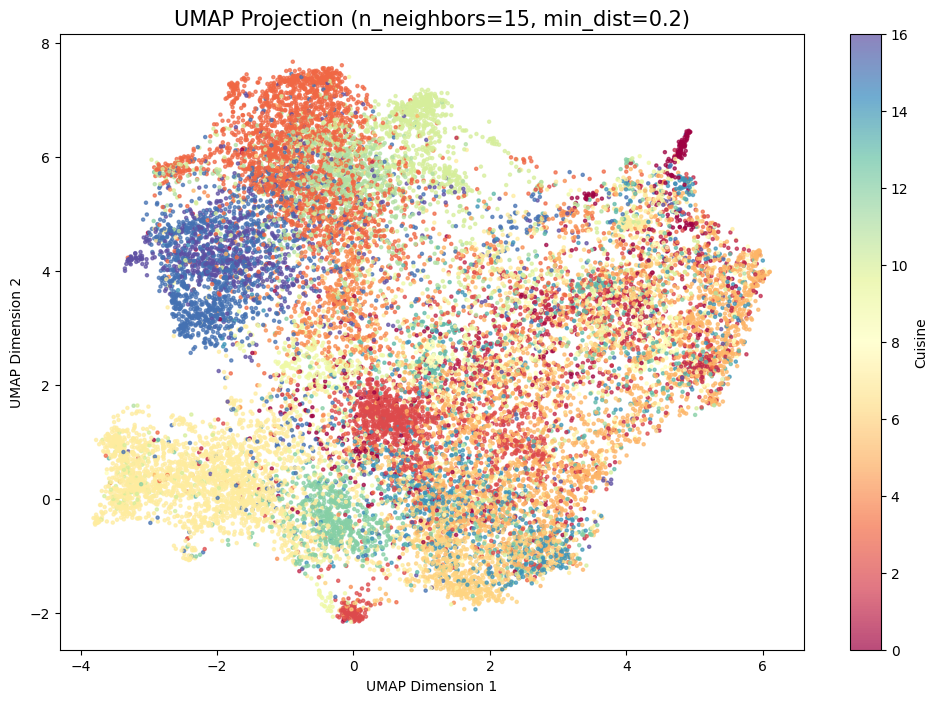

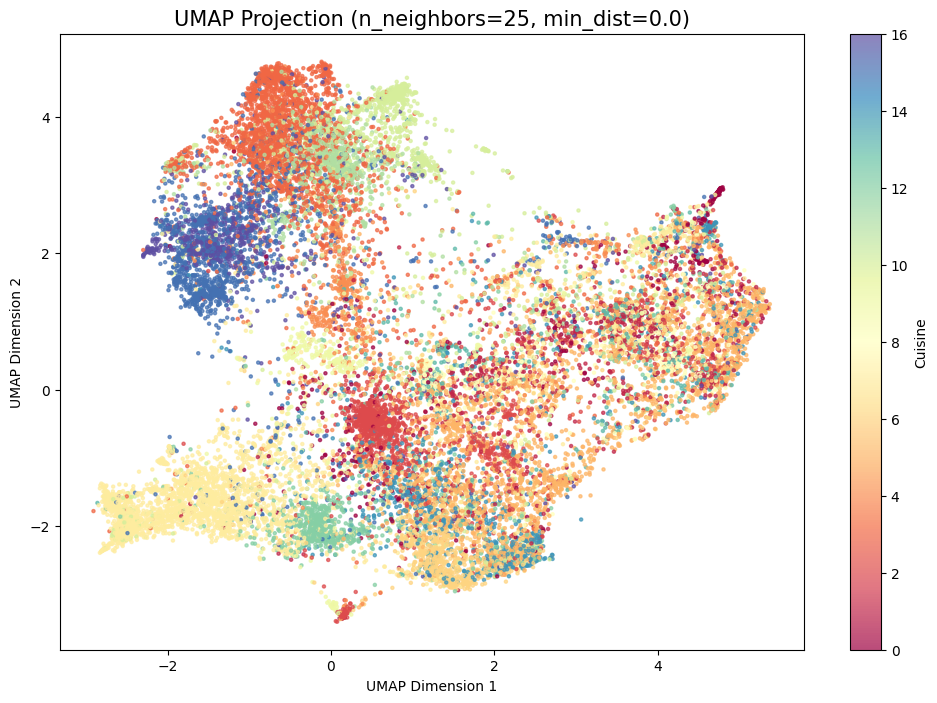

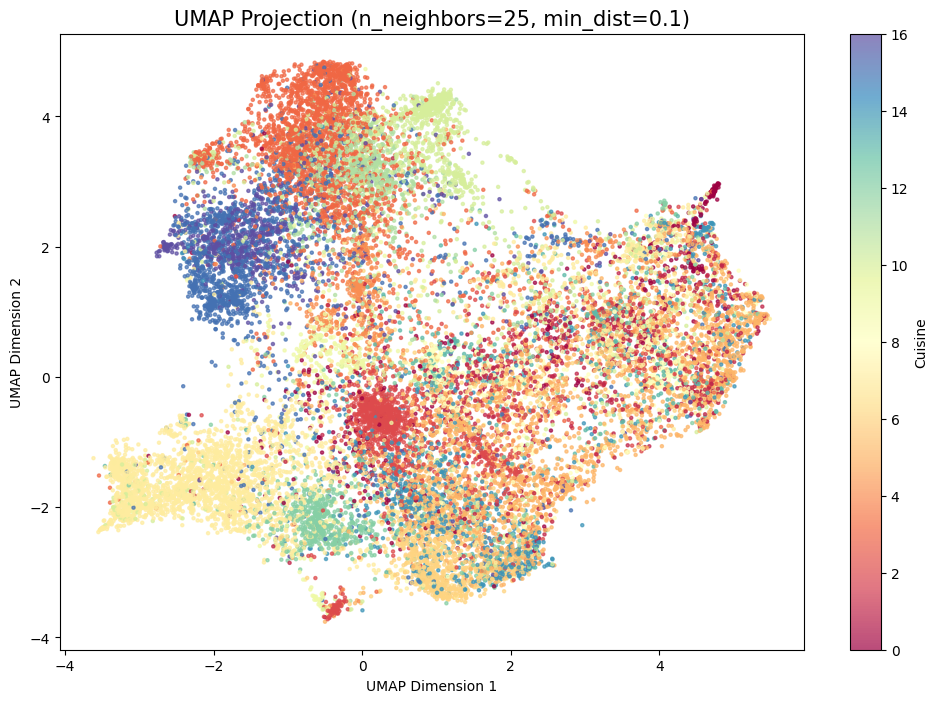

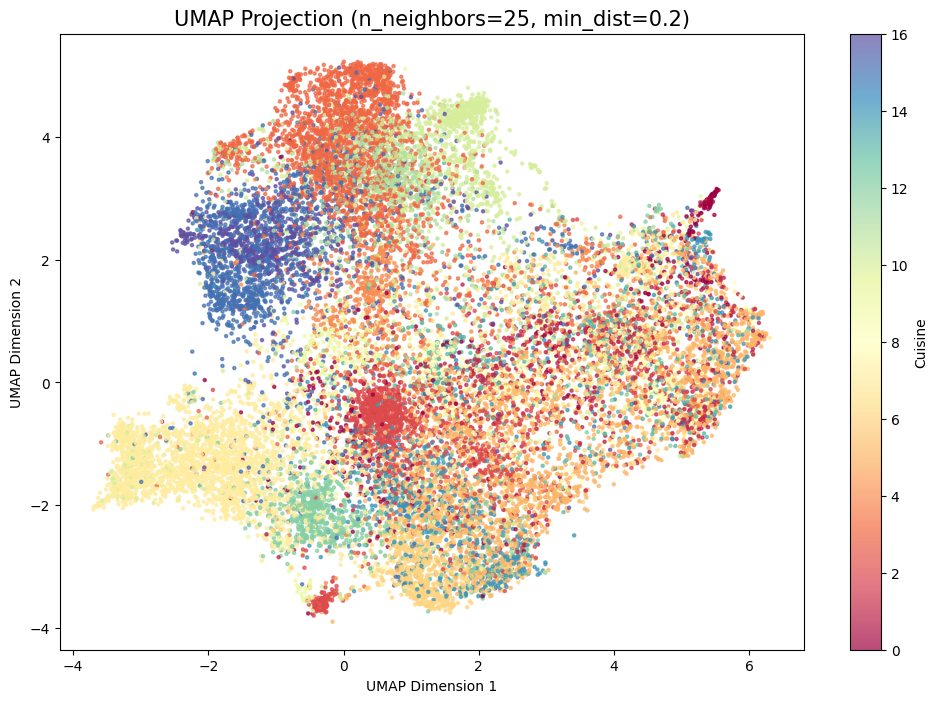

      UMAP1     UMAP2   cuisine     id
0  1.644603 -3.011924     greek  10259
1 -0.251263  0.873492  filipino  20130
2 -0.555926  1.914204    indian  22213
3  5.558677 -0.621841    indian  13162
4 -2.406207  0.612445  jamaican   6602


In [100]:
# Initialize a dictionary to store the embedding DataFrames for each UMAP run
umap_results = {}

# Loop over different values for n_neighbors and min_dist
for n_neighbors in [10, 15, 25]:
    for min_dist in [0.0, 0.1, 0.2]:
        # Initialize UMAP with current parameters
        reducer = umap.UMAP(
            n_neighbors=n_neighbors,
            min_dist=min_dist,
            n_components=2,
            metric=metric,
            random_state=random_state
        )
        
        # Apply UMAP to the feature matrix
        embedding = reducer.fit_transform(feature_matrix)
        
        # Create a new DataFrame to store the embedding and cuisine labels
        embedding_df = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'])
        embedding_df['cuisine'] = recipes_df['cuisine'].values
        embedding_df['id'] = recipes_df['id'].values
        
        # Generate a unique key for the current combination of n_neighbors and min_dist
        umap_key = f'nn_{n_neighbors}_md_{min_dist}'
        
        # Save the embedding DataFrame in the dictionary
        umap_results[umap_key] = embedding_df
        
        # Plot the results (optional)
        plt.figure(figsize=(12, 8))
        scatter = plt.scatter(
            embedding_df['UMAP1'],
            embedding_df['UMAP2'],
            c=pd.Categorical(embedding_df['cuisine']).codes,
            cmap='Spectral',
            s=5,
            alpha=0.7
        )
        plt.title(f'UMAP Projection (n_neighbors={n_neighbors}, min_dist={min_dist})', fontsize=15)
        plt.xlabel('UMAP Dimension 1')
        plt.ylabel('UMAP Dimension 2')
        plt.colorbar(scatter, label='Cuisine')
        plt.show()

# Example: Accessing one of the results
example_key = 'nn_10_md_0.0'
example_embedding_df = umap_results[example_key]
print(example_embedding_df.head())


Loading data...
Total recipes loaded: 49718
Filtering cuisines with <= 3003 occurrences...
Number of recipes after filtering: 21178
Creating feature matrix...
Feature matrix shape: (21178, 5328)
Number of unique ingredients: 5328
Applying UMAP with multiple parameter combinations...
UMAP embeddings created for 9 parameter combinations.
Plotting UMAP embeddings...


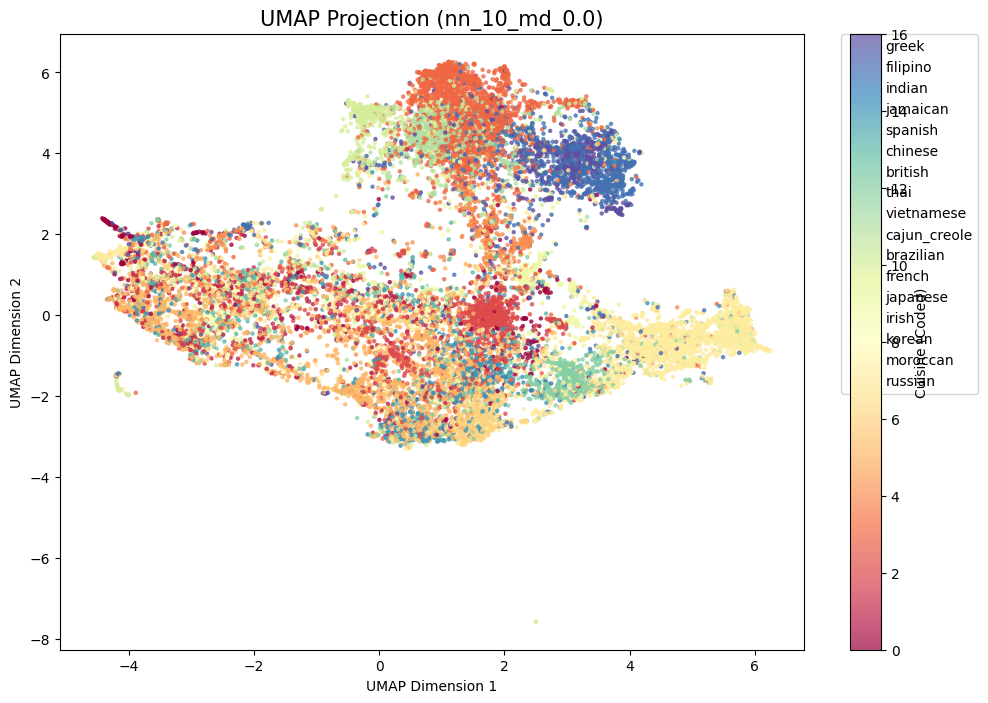

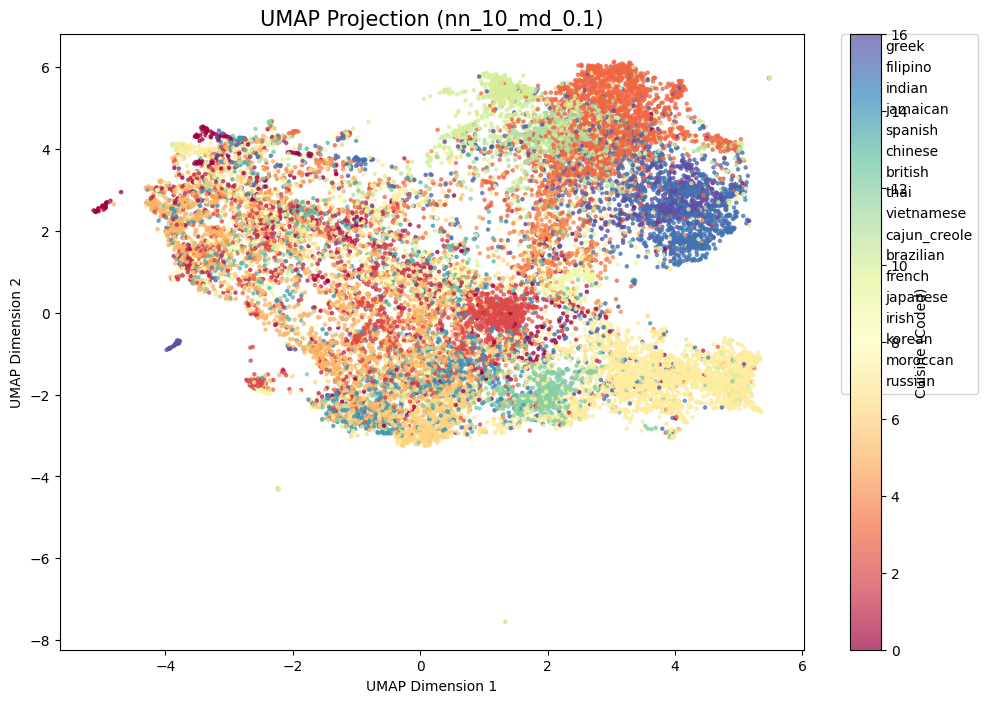

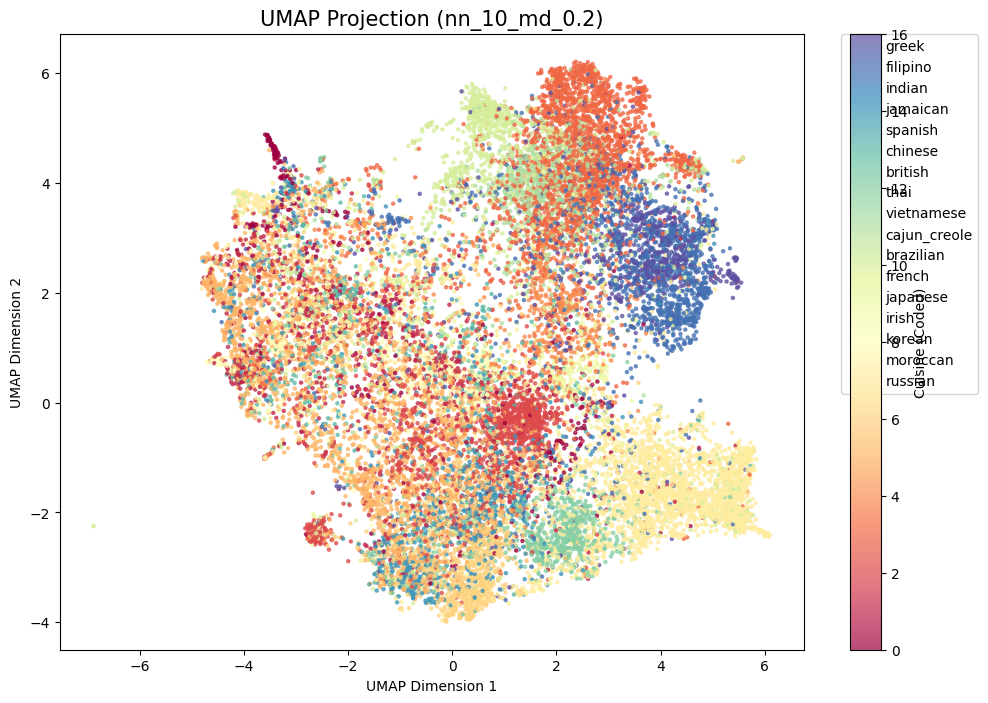

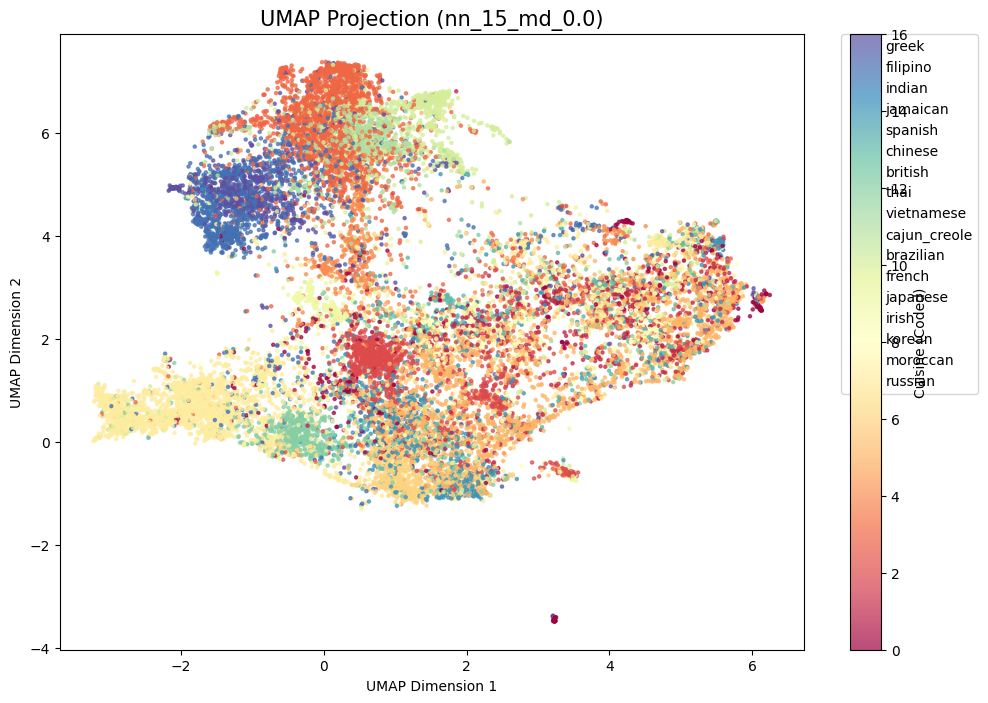

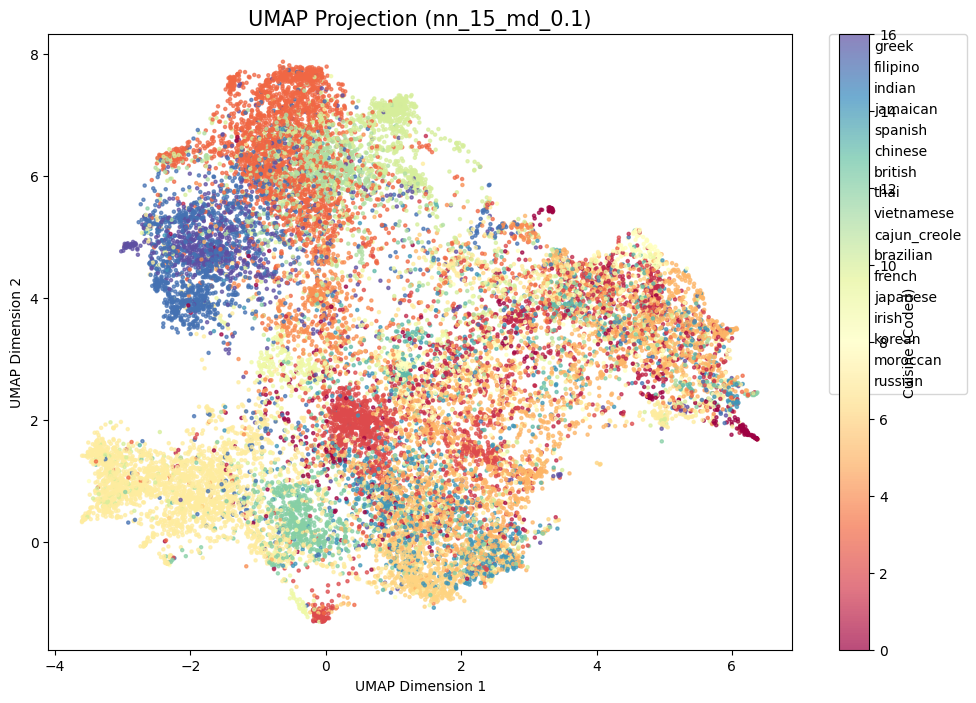

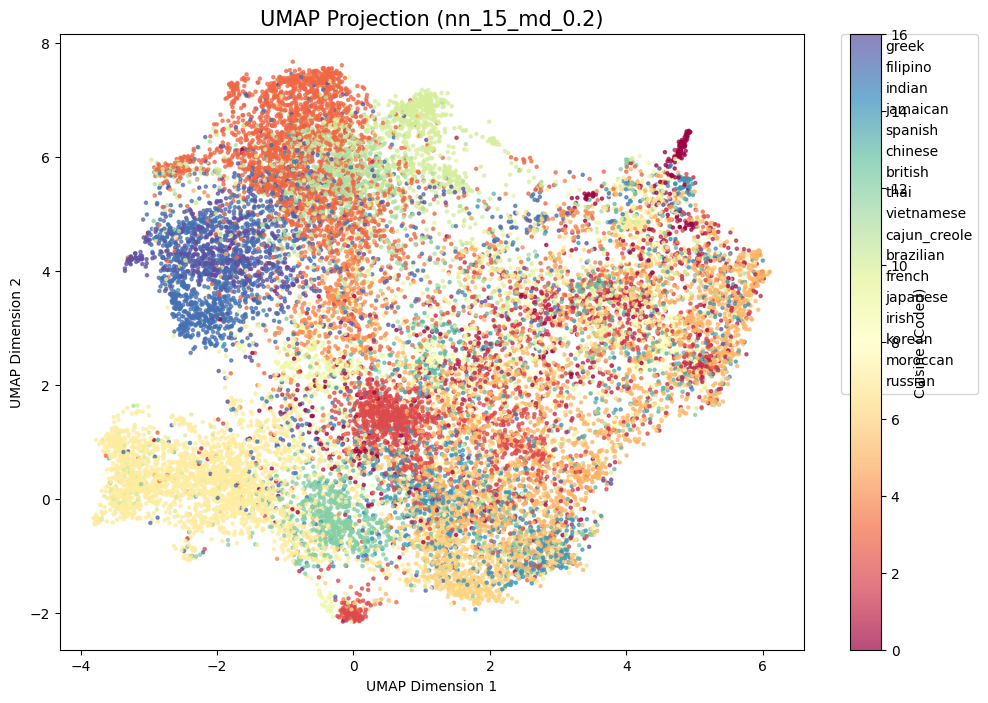

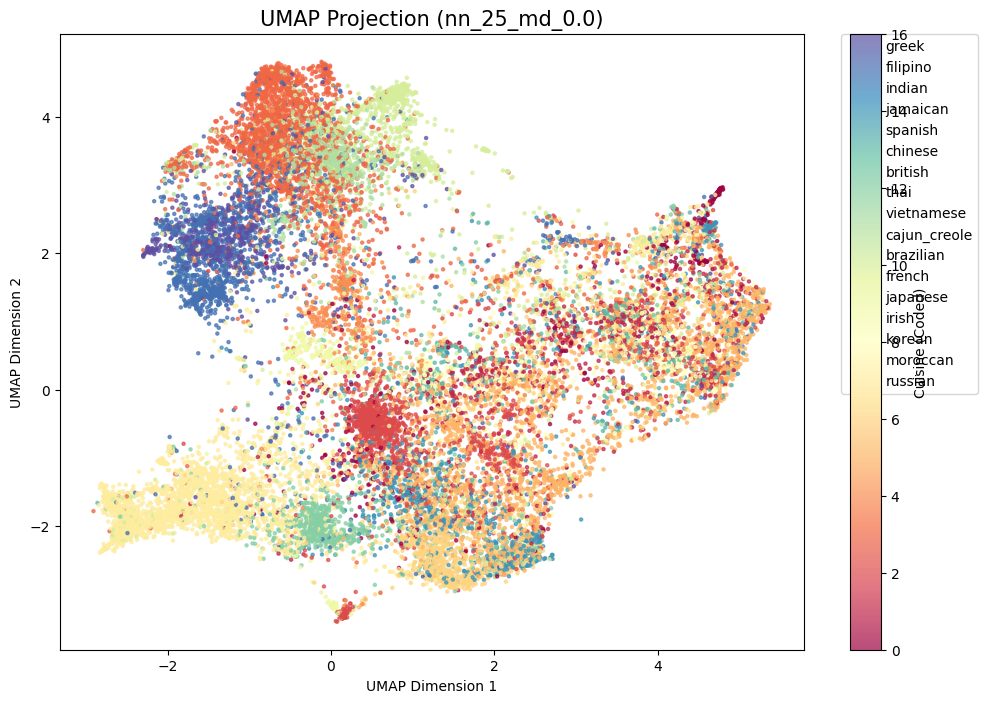

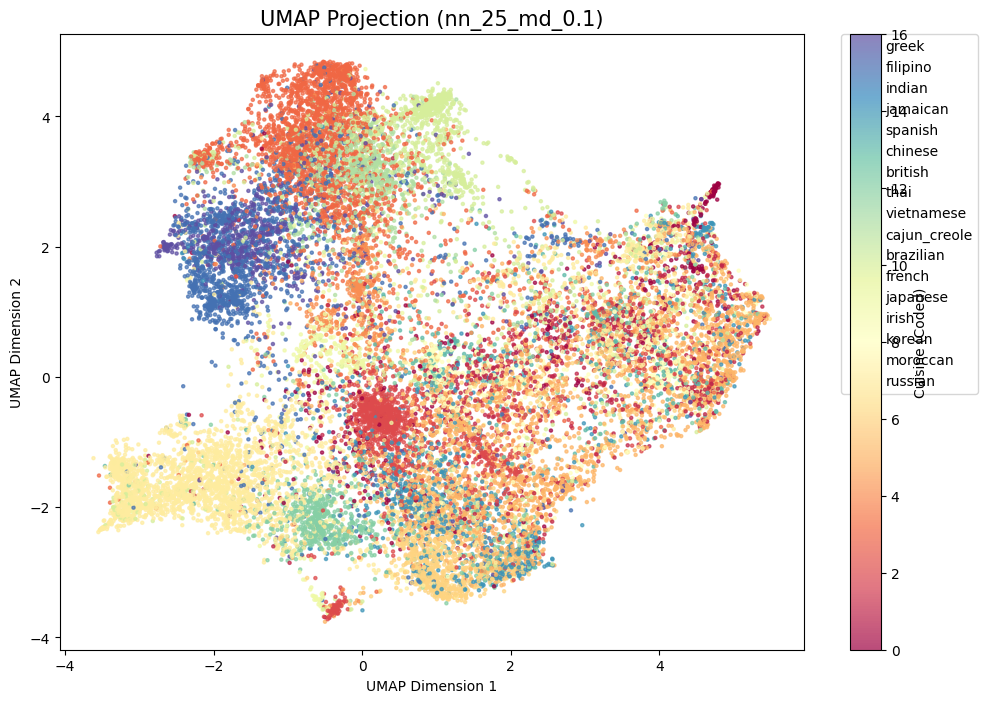

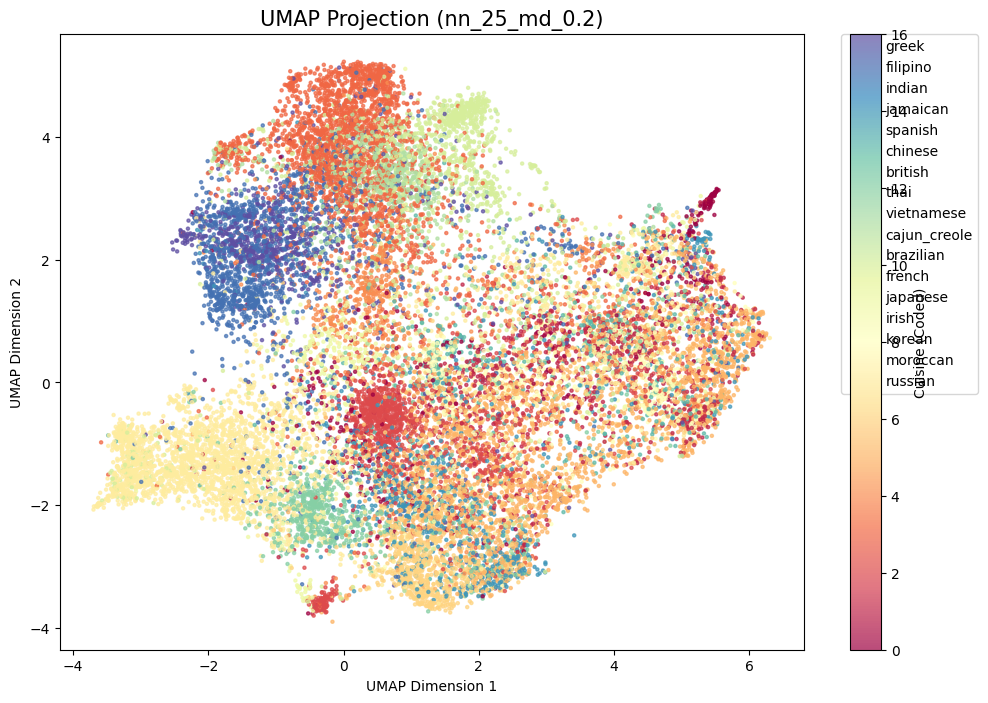

Selected UMAP embedding: nn_15_md_0.1
Fitting Nearest Neighbors model...


ValueError: Input X contains NaN.
NearestNeighbors does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

In [102]:
import pandas as pd
import numpy as np
import json
import umap
import matplotlib.pyplot as plt
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.neighbors import NearestNeighbors
from collections import Counter
import itertools
import plotly.express as px

# ------------------------------
# Step 1: Load and Preprocess Data
# ------------------------------
def load_data(train_file, test_file):
    """
    Load recipe data from JSON files and combine them into a single DataFrame.
    
    Parameters:
        train_file (str): Path to the training JSON file.
        test_file (str): Path to the testing JSON file.
        
    Returns:
        pd.DataFrame: Combined DataFrame containing all recipes.
    """
    # Load JSON data from files
    with open(train_file, 'r', encoding='utf-8') as f:
        train_data = json.load(f)

    with open(test_file, 'r', encoding='utf-8') as f:
        test_data = json.load(f)

    # Convert JSON data to DataFrames
    train_df = pd.json_normalize(train_data)
    test_df = pd.json_normalize(test_data)

    # Merge the DataFrames (concatenation)
    recipes_df = pd.concat([train_df, test_df], ignore_index=True)

    # Fill NaN values in 'cuisine' with 'Unknown'
    recipes_df['cuisine'] = recipes_df['cuisine'].fillna('Unknown')

    return recipes_df

# ------------------------------
# Step 2: Filter Cuisines
# ------------------------------
def filter_cuisines(recipes_df, threshold=3003):
    """
    Filter the DataFrame to include only cuisines with occurrences <= threshold.
    
    Parameters:
        recipes_df (pd.DataFrame): DataFrame containing all recipes.
        threshold (int): Maximum number of occurrences to include a cuisine.
        
    Returns:
        pd.DataFrame: Filtered DataFrame.
    """
    cuisine_counts = recipes_df['cuisine'].value_counts()
    filtered_cuisines = cuisine_counts[cuisine_counts <= threshold].index
    filtered_recipes_df = recipes_df[recipes_df['cuisine'].isin(filtered_cuisines)].reset_index(drop=True)
    return filtered_recipes_df

# ------------------------------
# Step 3: Create Feature Matrix
# ------------------------------
def create_feature_matrix(filtered_recipes_df):
    """
    Create a one-hot encoded feature matrix from the ingredients.
    
    Parameters:
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        
    Returns:
        tuple: (feature_matrix (np.array), ingredient_names (list))
    """
    mlb = MultiLabelBinarizer()
    feature_matrix = mlb.fit_transform(filtered_recipes_df['ingredients'])
    ingredient_names = mlb.classes_
    return feature_matrix, ingredient_names

# ------------------------------
# Step 4: Apply UMAP with Multiple Parameters
# ------------------------------
def apply_umap(feature_matrix, n_neighbors_list, min_dist_list, metric='jaccard', n_components=2, random_state=42):
    """
    Apply UMAP dimensionality reduction with multiple parameter combinations.
    
    Parameters:
        feature_matrix (np.array): High-dimensional feature matrix.
        n_neighbors_list (list): List of n_neighbors values to iterate over.
        min_dist_list (list): List of min_dist values to iterate over.
        metric (str): Distance metric for UMAP.
        n_components (int): Number of dimensions for UMAP.
        random_state (int): Random state for reproducibility.
        
    Returns:
        dict: Dictionary storing UMAP embeddings for each parameter combination.
    """
    umap_results = {}
    for n_neighbors, min_dist in itertools.product(n_neighbors_list, min_dist_list):
        reducer = umap.UMAP(
            n_neighbors=n_neighbors,
            min_dist=min_dist,
            n_components=n_components,
            metric=metric,
            random_state=random_state
        )
        embedding = reducer.fit_transform(feature_matrix)
        embedding_df = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'])
        umap_results[f'nn_{n_neighbors}_md_{min_dist}'] = embedding_df
    return umap_results

# ------------------------------
# Step 5: Plot UMAP Embeddings
# ------------------------------
def plot_umap_embedding(embedding_df, filtered_recipes_df, title='UMAP Projection'):
    """
    Plot a 2D UMAP embedding colored by cuisine type.
    
    Parameters:
        embedding_df (pd.DataFrame): DataFrame containing UMAP1 and UMAP2.
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        title (str): Title of the plot.
    """
    plt.figure(figsize=(12,8))
    scatter = plt.scatter(
        embedding_df['UMAP1'],
        embedding_df['UMAP2'],
        c=pd.Categorical(filtered_recipes_df['cuisine']).codes,
        cmap='Spectral',
        s=5,
        alpha=0.7
    )
    plt.title(title, fontsize=15)
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    # Create a legend for cuisines
    unique_cuisines = filtered_recipes_df['cuisine'].unique()
    cuisine_to_color = {cuisine: idx for idx, cuisine in enumerate(unique_cuisines)}
    handles = []
    for cuisine, color_idx in cuisine_to_color.items():
        handles.append(
            plt.Line2D(
                [], [], marker='o', color='w', label=cuisine,
                markerfacecolor=plt.cm.Spectral(color_idx / len(unique_cuisines)), markersize=5
            )
        )
    plt.legend(handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.colorbar(scatter, label='Cuisine (Coded)')
    plt.show()

# ------------------------------
# Step 6: Fit Nearest Neighbors
# ------------------------------
def fit_nearest_neighbors(embedding_df, n_neighbors=10):
    """
    Fit a Nearest Neighbors model on the UMAP embedding.
    
    Parameters:
        embedding_df (pd.DataFrame): DataFrame containing UMAP1 and UMAP2.
        n_neighbors (int): Number of neighbors to use.
        
    Returns:
        NearestNeighbors: Fitted NearestNeighbors model.
    """
    nbrs = NearestNeighbors(n_neighbors=n_neighbors, algorithm='ball_tree').fit(embedding_df[['UMAP1', 'UMAP2']])
    return nbrs

# ------------------------------
# Step 7: Find Neighbors
# ------------------------------
def find_neighbors(nbrs, embedding_df, recipe_index):
    """
    Find nearest neighbors for a given recipe index.
    
    Parameters:
        nbrs (NearestNeighbors): Fitted NearestNeighbors model.
        embedding_df (pd.DataFrame): DataFrame containing UMAP1 and UMAP2.
        recipe_index (int): Index of the target recipe.
        
    Returns:
        np.array: Indices of the nearest neighbors.
    """
    distances, indices = nbrs.kneighbors([embedding_df.loc[recipe_index, ['UMAP1', 'UMAP2']]])
    return indices.flatten()

# ------------------------------
# Step 8: Recommend Ingredients
# ------------------------------
def recommend_ingredients(recipe_id, filtered_recipes_df, embedding_df, nbrs, top_k=5, threshold=0.5):
    """
    Recommend ingredient additions and removals for a given recipe.
    
    Parameters:
        recipe_id (int): ID of the target recipe.
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        embedding_df (pd.DataFrame): DataFrame containing UMAP embeddings.
        nbrs (NearestNeighbors): Fitted NearestNeighbors model.
        top_k (int): Number of recommendations for additions and removals.
        threshold (float): Frequency threshold for recommending removals.
        
    Returns:
        dict: Recommendations containing additions and removals.
    """
    # Locate the recipe index
    recipe_indices = filtered_recipes_df.index[filtered_recipes_df['id'] == recipe_id].tolist()
    if not recipe_indices:
        print(f"Recipe ID {recipe_id} not found.")
        return None
    recipe_index = recipe_indices[0]
    
    # Find nearest neighbors
    neighbors = find_neighbors(nbrs, embedding_df, recipe_index)
    
    # Get ingredients of the target recipe
    target_ingredients = set(filtered_recipes_df.loc[recipe_index, 'ingredients'])
    
    # Aggregate ingredients from neighbors
    neighbor_ingredients = []
    for neighbor in neighbors:
        if neighbor != recipe_index:
            neighbor_ingredients.extend(filtered_recipes_df.loc[neighbor, 'ingredients'])
    neighbor_ingredients = set(neighbor_ingredients)
    
    # Identify potential additions (ingredients in neighbors but not in target)
    potential_additions = neighbor_ingredients - target_ingredients
    
    # Identify potential removals (ingredients in target but less common in neighbors)
    neighbor_ingredients_list = []
    for neighbor in neighbors:
        if neighbor != recipe_index:
            neighbor_ingredients_list.extend(filtered_recipes_df.loc[neighbor, 'ingredients'])
    ingredient_counts = Counter(neighbor_ingredients_list)
    
    removal_candidates = []
    for ingredient in target_ingredients:
        if ingredient_counts[ingredient] < (len(neighbors) * threshold):
            removal_candidates.append(ingredient)
    
    # Recommend top_k additions based on frequency
    additions = Counter()
    for ingredient in potential_additions:
        additions[ingredient] = ingredient_counts[ingredient]
    top_additions = [item for item, count in additions.most_common(top_k)]
    
    # Recommend top_k removals
    removals = removal_candidates[:top_k]
    
    return {
        'recipe_id': recipe_id,
        'additions': top_additions,
        'removals': removals
    }

# ------------------------------
# Step 9: Visualize Recommendations
# ------------------------------
def visualize_recommendations(recipe_id, filtered_recipes_df, embedding_df, nbrs, selected_key):
    """
    Visualize the target recipe and its nearest neighbors in the UMAP embedding.
    
    Parameters:
        recipe_id (int): ID of the target recipe.
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        embedding_df (pd.DataFrame): DataFrame containing UMAP embeddings.
        nbrs (NearestNeighbors): Fitted NearestNeighbors model.
        selected_key (str): Key identifying the UMAP embedding parameters.
    """
    # Locate the recipe index
    recipe_indices = filtered_recipes_df.index[filtered_recipes_df['id'] == recipe_id].tolist()
    if not recipe_indices:
        print(f"Recipe ID {recipe_id} not found.")
        return
    recipe_index = recipe_indices[0]
    
    # Find nearest neighbors
    neighbors = find_neighbors(nbrs, embedding_df, recipe_index)
    
    # Plot the embedding
    plt.figure(figsize=(12,8))
    
    # Plot all recipes in light gray
    plt.scatter(
        embedding_df['UMAP1'],
        embedding_df['UMAP2'],
        c='lightgray',
        s=5,
        alpha=0.3,
        label='Other Recipes'
    )
    
    # Highlight neighbors in blue
    plt.scatter(
        embedding_df.loc[neighbors, 'UMAP1'],
        embedding_df.loc[neighbors, 'UMAP2'],
        c='blue',
        s=20,
        alpha=0.6,
        label='Nearest Neighbors'
    )
    
    # Highlight the target recipe in red
    plt.scatter(
        embedding_df.loc[recipe_index, 'UMAP1'],
        embedding_df.loc[recipe_index, 'UMAP2'],
        c='red',
        s=100,
        marker='*',
        label='Target Recipe'
    )
    
    plt.title(f'UMAP Projection with Recommendations for Recipe ID {recipe_id} ({selected_key})', fontsize=15)
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    plt.legend()
    plt.show()

# ------------------------------
# Step 10: Main Execution Flow
# ------------------------------
def main():
    # Define file paths
    train_file = r'C:\Users\ezequ\OneDrive\Documentos\Facultad\data viz\food\get_data\train.json'
    test_file = r'C:\Users\ezequ\OneDrive\Documentos\Facultad\data viz\food\get_data\test.json'
    
    # Step 1: Load data
    print("Loading data...")
    recipes_df = load_data(train_file, test_file)
    print(f"Total recipes loaded: {recipes_df.shape[0]}")
    
    # Step 2: Filter cuisines
    print("Filtering cuisines with <= 3003 occurrences...")
    filtered_recipes_df = filter_cuisines(recipes_df, threshold=3003)
    print(f"Number of recipes after filtering: {filtered_recipes_df.shape[0]}")
    
    # Step 3: Create feature matrix
    print("Creating feature matrix...")
    feature_matrix, ingredient_names = create_feature_matrix(filtered_recipes_df)
    print(f"Feature matrix shape: {feature_matrix.shape}")
    print(f"Number of unique ingredients: {len(ingredient_names)}")
    
    # Step 4: Apply UMAP with multiple parameters
    print("Applying UMAP with multiple parameter combinations...")
    n_neighbors_list = [10, 15, 25]
    min_dist_list = [0.0, 0.1, 0.2]
    metric = 'jaccard'
    n_components = 2
    random_state = 42
    
    umap_results = apply_umap(feature_matrix, n_neighbors_list, min_dist_list, metric, n_components, random_state)
    print(f"UMAP embeddings created for {len(umap_results)} parameter combinations.")
    
    # Step 5: Plot each UMAP embedding
    print("Plotting UMAP embeddings...")
    for key, embedding_df in umap_results.items():
        plot_umap_embedding(embedding_df, filtered_recipes_df, title=f'UMAP Projection ({key})')
    
    # Step 6: Select the desired UMAP embedding
    selected_key = 'nn_15_md_0.1'  # Change this based on which embedding you prefer
    if selected_key not in umap_results:
        print(f"Selected UMAP key '{selected_key}' not found in umap_results.")
        return
    selected_embedding_df = umap_results[selected_key]
    print(f"Selected UMAP embedding: {selected_key}")
    
    # Step 7: Fit Nearest Neighbors
    print("Fitting Nearest Neighbors model...")
    nbrs = fit_nearest_neighbors(selected_embedding_df, n_neighbors=10)
    print("Nearest Neighbors model fitted.")
    
    # Step 8: Recommend ingredients for a specific recipe
    # Replace '10259' with the desired recipe ID
    recipe_id = 10259
    print(f"Generating ingredient recommendations for Recipe ID {recipe_id}...")
    recommendations = recommend_ingredients(recipe_id, filtered_recipes_df, selected_embedding_df, nbrs, top_k=5, threshold=0.5)
    
    if recommendations:
        print(f"\nRecommendations for Recipe ID {recommendations['recipe_id']}:")
        print(f"  Ingredients to Add: {recommendations['additions']}")
        print(f"  Ingredients to Remove: {recommendations['removals']}")
    
    # Step 9: Visualize recommendations
    print(f"Visualizing recommendations for Recipe ID {recipe_id}...")
    visualize_recommendations(recipe_id, filtered_recipes_df, selected_embedding_df, nbrs, selected_key)
    
    # Optional: Save the selected embedding to a CSV file
    # selected_embedding_df.to_csv('selected_umap_embedding.csv', index=False)
    print("Process completed.")

if __name__ == "__main__":
    main()


In [104]:
import pandas as pd
import numpy as np
import json
import umap
import matplotlib.pyplot as plt
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.neighbors import NearestNeighbors
from collections import Counter
import itertools
import plotly.express as px

# ------------------------------
# Step 1: Load and Preprocess Data
# ------------------------------
def load_data(train_file, test_file):
    """
    Load recipe data from JSON files and combine them into a single DataFrame.
    
    Parameters:
        train_file (str): Path to the training JSON file.
        test_file (str): Path to the testing JSON file.
        
    Returns:
        pd.DataFrame: Combined DataFrame containing all recipes.
    """
    # Load JSON data from files
    with open(train_file, 'r', encoding='utf-8') as f:
        train_data = json.load(f)

    with open(test_file, 'r', encoding='utf-8') as f:
        test_data = json.load(f)

    # Convert JSON data to DataFrames
    train_df = pd.json_normalize(train_data)
    test_df = pd.json_normalize(test_data)

    # Merge the DataFrames (concatenation)
    recipes_df = pd.concat([train_df, test_df], ignore_index=True)

    # Fill NaN values in 'cuisine' with 'Unknown'
    recipes_df['cuisine'] = recipes_df['cuisine'].fillna('Unknown')

    return recipes_df

# ------------------------------
# Step 2: Filter Cuisines
# ------------------------------
def filter_cuisines(recipes_df, threshold=3003):
    """
    Filter the DataFrame to include only cuisines with occurrences <= threshold.
    
    Parameters:
        recipes_df (pd.DataFrame): DataFrame containing all recipes.
        threshold (int): Maximum number of occurrences to include a cuisine.
        
    Returns:
        pd.DataFrame: Filtered DataFrame.
    """
    cuisine_counts = recipes_df['cuisine'].value_counts()
    filtered_cuisines = cuisine_counts[cuisine_counts <= threshold].index
    filtered_recipes_df = recipes_df[recipes_df['cuisine'].isin(filtered_cuisines)].reset_index(drop=True)
    return filtered_recipes_df

# ------------------------------
# Step 3: Handle NaNs in Ingredients
# ------------------------------
def handle_nan_ingredients(filtered_recipes_df):
    """
    Replace NaN values in 'ingredients' with empty lists.
    
    Parameters:
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        
    Returns:
        pd.DataFrame: DataFrame with no NaNs in 'ingredients'.
    """
    # Check for NaNs in 'ingredients'
    nan_ingredients_count = filtered_recipes_df['ingredients'].isna().sum()
    print(f"Number of recipes with NaN ingredients: {nan_ingredients_count}")
    
    # Replace NaNs with empty lists
    filtered_recipes_df['ingredients'] = filtered_recipes_df['ingredients'].apply(lambda x: x if isinstance(x, list) else [])
    
    # Verify replacement
    nan_after = filtered_recipes_df['ingredients'].isna().sum()
    print(f"Number of recipes with NaN ingredients after replacement: {nan_after}")
    
    return filtered_recipes_df

# ------------------------------
# Step 4: Create Feature Matrix
# ------------------------------
def create_feature_matrix(filtered_recipes_df):
    """
    Create a one-hot encoded feature matrix from the ingredients.
    
    Parameters:
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        
    Returns:
        tuple: (feature_matrix (np.array), ingredient_names (list))
    """
    mlb = MultiLabelBinarizer()
    feature_matrix = mlb.fit_transform(filtered_recipes_df['ingredients'])
    ingredient_names = mlb.classes_
    return feature_matrix, ingredient_names

# ------------------------------
# Step 5: Check Feature Matrix for NaNs
# ------------------------------
def check_feature_matrix(feature_matrix):
    """
    Check for NaN values in the feature matrix.
    
    Parameters:
        feature_matrix (np.array): High-dimensional feature matrix.
        
    Raises:
        ValueError: If NaNs are found in the feature matrix.
    """
    nan_count = np.isnan(feature_matrix).sum()
    if nan_count > 0:
        print(f"Feature matrix contains {nan_count} NaN values. Filling them with 0.")
        # Since one-hot encoded, filling NaNs with 0 is appropriate
        feature_matrix = np.nan_to_num(feature_matrix, nan=0)
    else:
        print("No NaN values found in the feature matrix.")
    return feature_matrix

# ------------------------------
# Step 6: Apply UMAP with Multiple Parameters
# ------------------------------
def apply_umap(feature_matrix, n_neighbors_list, min_dist_list, metric='jaccard', n_components=2, random_state=42):
    """
    Apply UMAP dimensionality reduction with multiple parameter combinations.
    
    Parameters:
        feature_matrix (np.array): High-dimensional feature matrix.
        n_neighbors_list (list): List of n_neighbors values to iterate over.
        min_dist_list (list): List of min_dist values to iterate over.
        metric (str): Distance metric for UMAP.
        n_components (int): Number of dimensions for UMAP.
        random_state (int): Random state for reproducibility.
        
    Returns:
        dict: Dictionary storing UMAP embeddings for each parameter combination.
    """
    umap_results = {}
    for n_neighbors, min_dist in itertools.product(n_neighbors_list, min_dist_list):
        reducer = umap.UMAP(
            n_neighbors=n_neighbors,
            min_dist=min_dist,
            n_components=n_components,
            metric=metric,
            random_state=random_state
        )
        embedding = reducer.fit_transform(feature_matrix)
        embedding_df = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'])
        umap_results[f'nn_{n_neighbors}_md_{min_dist}'] = embedding_df
    return umap_results

# ------------------------------
# Step 7: Check Embedding for NaNs
# ------------------------------
def check_embedding_df(embedding_df, filtered_recipes_df):
    """
    Check for NaN values in the UMAP embedding and remove corresponding samples.
    
    Parameters:
        embedding_df (pd.DataFrame): DataFrame containing UMAP embeddings.
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        
    Returns:
        tuple: (clean_embedding_df, clean_recipes_df)
    """
    # Check for NaNs in embedding
    nan_embedding = embedding_df[['UMAP1', 'UMAP2']].isna().any(axis=1)
    nan_count = nan_embedding.sum()
    if nan_count > 0:
        print(f"Embedding contains {nan_count} NaN values. Removing these samples.")
        # Remove rows with NaNs in embedding
        clean_embedding_df = embedding_df[~nan_embedding].reset_index(drop=True)
        clean_recipes_df = filtered_recipes_df[~nan_embedding].reset_index(drop=True)
    else:
        print("No NaN values found in the UMAP embedding.")
        clean_embedding_df = embedding_df.copy()
        clean_recipes_df = filtered_recipes_df.copy()
    
    return clean_embedding_df, clean_recipes_df

# ------------------------------
# Step 8: Plot UMAP Embedding
# ------------------------------
def plot_umap_embedding(embedding_df, filtered_recipes_df, title='UMAP Projection'):
    """
    Plot a 2D UMAP embedding colored by cuisine type.
    
    Parameters:
        embedding_df (pd.DataFrame): DataFrame containing UMAP1 and UMAP2.
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        title (str): Title of the plot.
    """
    plt.figure(figsize=(12,8))
    scatter = plt.scatter(
        embedding_df['UMAP1'],
        embedding_df['UMAP2'],
        c=pd.Categorical(filtered_recipes_df['cuisine']).codes,
        cmap='Spectral',
        s=5,
        alpha=0.7
    )
    plt.title(title, fontsize=15)
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    # Create a legend for cuisines
    unique_cuisines = filtered_recipes_df['cuisine'].unique()
    cuisine_to_color = {cuisine: idx for idx, cuisine in enumerate(unique_cuisines)}
    handles = []
    for cuisine, color_idx in cuisine_to_color.items():
        handles.append(
            plt.Line2D(
                [], [], marker='o', color='w', label=cuisine,
                markerfacecolor=plt.cm.Spectral(color_idx / len(unique_cuisines)), markersize=5
            )
        )
    plt.legend(handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.colorbar(scatter, label='Cuisine (Coded)')
    plt.show()

# ------------------------------
# Step 9: Fit Nearest Neighbors
# ------------------------------
def fit_nearest_neighbors(embedding_df, n_neighbors=10):
    """
    Fit a Nearest Neighbors model on the UMAP embedding.
    
    Parameters:
        embedding_df (pd.DataFrame): DataFrame containing UMAP1 and UMAP2.
        n_neighbors (int): Number of neighbors to use.
        
    Returns:
        NearestNeighbors: Fitted NearestNeighbors model.
    """
    nbrs = NearestNeighbors(n_neighbors=n_neighbors, algorithm='ball_tree').fit(embedding_df[['UMAP1', 'UMAP2']])
    return nbrs

# ------------------------------
# Step 10: Find Neighbors
# ------------------------------
def find_neighbors(nbrs, embedding_df, recipe_index):
    """
    Find nearest neighbors for a given recipe index.
    
    Parameters:
        nbrs (NearestNeighbors): Fitted NearestNeighbors model.
        embedding_df (pd.DataFrame): DataFrame containing UMAP1 and UMAP2.
        recipe_index (int): Index of the target recipe.
        
    Returns:
        np.array: Indices of the nearest neighbors.
    """
    distances, indices = nbrs.kneighbors([embedding_df.loc[recipe_index, ['UMAP1', 'UMAP2']]])
    return indices.flatten()

# ------------------------------
# Step 11: Recommend Ingredients
# ------------------------------
def recommend_ingredients(recipe_id, filtered_recipes_df, embedding_df, nbrs, top_k=5, threshold=0.5):
    """
    Recommend ingredient additions and removals for a given recipe.
    
    Parameters:
        recipe_id (int): ID of the target recipe.
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        embedding_df (pd.DataFrame): DataFrame containing UMAP embeddings.
        nbrs (NearestNeighbors): Fitted NearestNeighbors model.
        top_k (int): Number of recommendations for additions and removals.
        threshold (float): Frequency threshold for recommending removals.
        
    Returns:
        dict: Recommendations containing additions and removals.
    """
    # Locate the recipe index
    recipe_indices = filtered_recipes_df.index[filtered_recipes_df['id'] == recipe_id].tolist()
    if not recipe_indices:
        print(f"Recipe ID {recipe_id} not found.")
        return None
    recipe_index = recipe_indices[0]
    
    # Find nearest neighbors
    neighbors = find_neighbors(nbrs, embedding_df, recipe_index)
    
    # Get ingredients of the target recipe
    target_ingredients = set(filtered_recipes_df.loc[recipe_index, 'ingredients'])
    
    # Aggregate ingredients from neighbors
    neighbor_ingredients = []
    for neighbor in neighbors:
        if neighbor != recipe_index:
            neighbor_ingredients.extend(filtered_recipes_df.loc[neighbor, 'ingredients'])
    neighbor_ingredients = set(neighbor_ingredients)
    
    # Identify potential additions (ingredients in neighbors but not in target)
    potential_additions = neighbor_ingredients - target_ingredients
    
    # Identify potential removals (ingredients in target but less common in neighbors)
    neighbor_ingredients_list = []
    for neighbor in neighbors:
        if neighbor != recipe_index:
            neighbor_ingredients_list.extend(filtered_recipes_df.loc[neighbor, 'ingredients'])
    ingredient_counts = Counter(neighbor_ingredients_list)
    
    removal_candidates = []
    for ingredient in target_ingredients:
        if ingredient_counts[ingredient] < (len(neighbors) * threshold):
            removal_candidates.append(ingredient)
    
    # Recommend top_k additions based on frequency
    additions = Counter()
    for ingredient in potential_additions:
        additions[ingredient] = ingredient_counts[ingredient]
    top_additions = [item for item, count in additions.most_common(top_k)]
    
    # Recommend top_k removals
    removals = removal_candidates[:top_k]
    
    return {
        'recipe_id': recipe_id,
        'additions': top_additions,
        'removals': removals
    }

# ------------------------------
# Step 12: Visualize Recommendations
# ------------------------------
def visualize_recommendations(recipe_id, filtered_recipes_df, embedding_df, nbrs, selected_key):
    """
    Visualize the target recipe and its nearest neighbors in the UMAP embedding.
    
    Parameters:
        recipe_id (int): ID of the target recipe.
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        embedding_df (pd.DataFrame): DataFrame containing UMAP embeddings.
        nbrs (NearestNeighbors): Fitted NearestNeighbors model.
        selected_key (str): Key identifying the UMAP embedding parameters.
    """
    # Locate the recipe index
    recipe_indices = filtered_recipes_df.index[filtered_recipes_df['id'] == recipe_id].tolist()
    if not recipe_indices:
        print(f"Recipe ID {recipe_id} not found.")
        return
    recipe_index = recipe_indices[0]
    
    # Find nearest neighbors
    neighbors = find_neighbors(nbrs, embedding_df, recipe_index)
    
    # Plot the embedding
    plt.figure(figsize=(12,8))
    
    # Plot all recipes in light gray
    plt.scatter(
        embedding_df['UMAP1'],
        embedding_df['UMAP2'],
        c='lightgray',
        s=5,
        alpha=0.3,
        label='Other Recipes'
    )
    
    # Highlight neighbors in blue
    plt.scatter(
        embedding_df.loc[neighbors, 'UMAP1'],
        embedding_df.loc[neighbors, 'UMAP2'],
        c='blue',
        s=20,
        alpha=0.6,
        label='Nearest Neighbors'
    )
    
    # Highlight the target recipe in red
    plt.scatter(
        embedding_df.loc[recipe_index, 'UMAP1'],
        embedding_df.loc[recipe_index, 'UMAP2'],
        c='red',
        s=100,
        marker='*',
        label='Target Recipe'
    )
    
    plt.title(f'UMAP Projection with Recommendations for Recipe ID {recipe_id} ({selected_key})', fontsize=15)
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    plt.legend()
    plt.show()



Loading data...
Total recipes loaded: 49718
Filtering cuisines with <= 3003 occurrences...
Number of recipes after filtering: 21178
Handling NaNs in 'ingredients'...
Number of recipes with NaN ingredients: 0
Number of recipes with NaN ingredients after replacement: 0
Creating feature matrix...
Feature matrix shape: (21178, 5328)
Number of unique ingredients: 5328
Checking feature matrix for NaNs...
No NaN values found in the feature matrix.
Applying UMAP with specified hyperparameters (n_neighbors=45, min_dist=0.15)...
UMAP embedding created.
Checking and cleaning UMAP embeddings...
Embedding contains 20 NaN values. Removing these samples.
Number of recipes after cleaning embeddings: 21158
Plotting UMAP embedding...


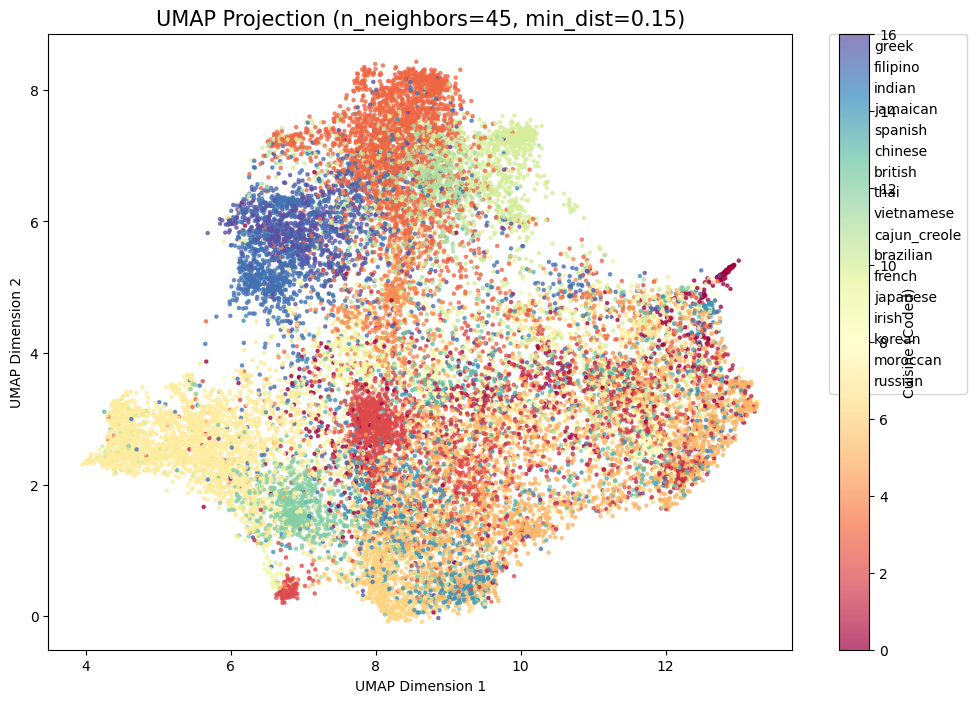

Fitting Nearest Neighbors model...
Nearest Neighbors model fitted.
Generating ingredient recommendations for Recipe ID 10259...

Recommendations for Recipe ID 10259:
  Ingredients to Add: ['cucumber', 'feta cheese', 'kalamata', 'salad dressing', 'roma tomatoes']
  Ingredients to Remove: ['black olives', 'garbanzo beans', 'garlic', 'seasoning', 'grape tomatoes']
Visualizing recommendations for Recipe ID 10259...


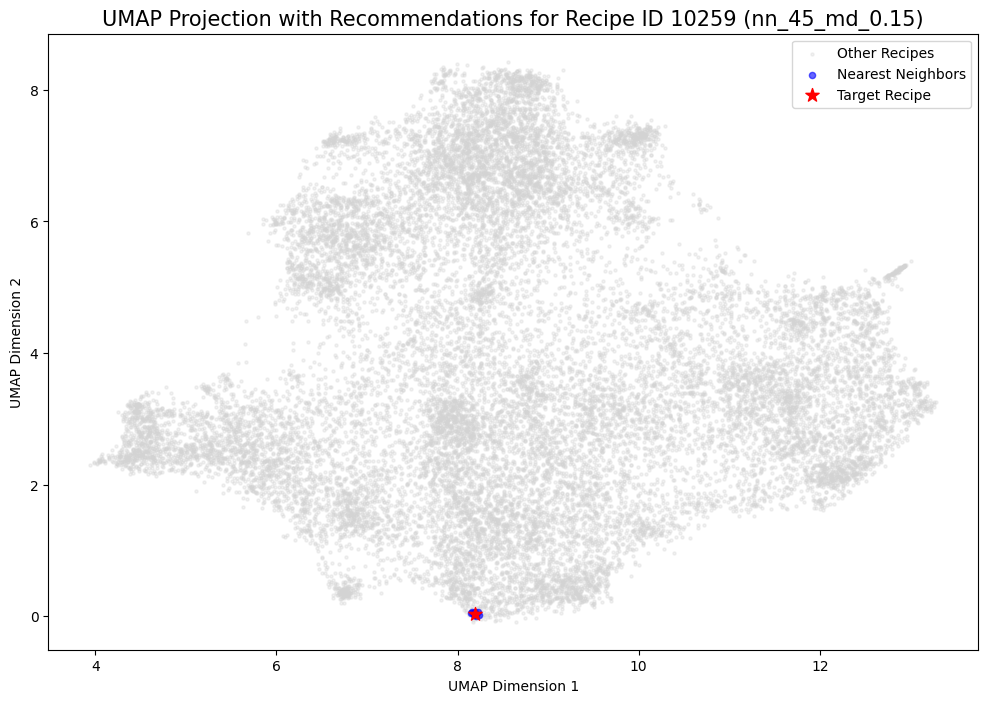

Process completed.


In [105]:
import pandas as pd
import numpy as np
import json
import umap
import matplotlib.pyplot as plt
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.neighbors import NearestNeighbors
from collections import Counter
import plotly.express as px

# ------------------------------
# Step 1: Load and Preprocess Data
# ------------------------------
def load_data(train_file, test_file):
    """
    Load recipe data from JSON files and combine them into a single DataFrame.
    
    Parameters:
        train_file (str): Path to the training JSON file.
        test_file (str): Path to the testing JSON file.
        
    Returns:
        pd.DataFrame: Combined DataFrame containing all recipes.
    """
    # Load JSON data from files
    with open(train_file, 'r', encoding='utf-8') as f:
        train_data = json.load(f)

    with open(test_file, 'r', encoding='utf-8') as f:
        test_data = json.load(f)

    # Convert JSON data to DataFrames
    train_df = pd.json_normalize(train_data)
    test_df = pd.json_normalize(test_data)

    # Merge the DataFrames (concatenation)
    recipes_df = pd.concat([train_df, test_df], ignore_index=True)

    # Fill NaN values in 'cuisine' with 'Unknown'
    recipes_df['cuisine'] = recipes_df['cuisine'].fillna('Unknown')

    return recipes_df

# ------------------------------
# Step 2: Filter Cuisines
# ------------------------------
def filter_cuisines(recipes_df, threshold=3003):
    """
    Filter the DataFrame to include only cuisines with occurrences <= threshold.
    
    Parameters:
        recipes_df (pd.DataFrame): DataFrame containing all recipes.
        threshold (int): Maximum number of occurrences to include a cuisine.
        
    Returns:
        pd.DataFrame: Filtered DataFrame.
    """
    cuisine_counts = recipes_df['cuisine'].value_counts()
    filtered_cuisines = cuisine_counts[cuisine_counts <= threshold].index
    filtered_recipes_df = recipes_df[recipes_df['cuisine'].isin(filtered_cuisines)].reset_index(drop=True)
    return filtered_recipes_df

# ------------------------------
# Step 3: Handle NaNs in Ingredients
# ------------------------------
def handle_nan_ingredients(filtered_recipes_df):
    """
    Replace NaN values in 'ingredients' with empty lists.
    
    Parameters:
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        
    Returns:
        pd.DataFrame: DataFrame with no NaNs in 'ingredients'.
    """
    # Check for NaNs in 'ingredients'
    nan_ingredients_count = filtered_recipes_df['ingredients'].isna().sum()
    print(f"Number of recipes with NaN ingredients: {nan_ingredients_count}")
    
    # Replace NaNs with empty lists
    filtered_recipes_df['ingredients'] = filtered_recipes_df['ingredients'].apply(lambda x: x if isinstance(x, list) else [])
    
    # Verify replacement
    nan_after = filtered_recipes_df['ingredients'].isna().sum()
    print(f"Number of recipes with NaN ingredients after replacement: {nan_after}")
    
    return filtered_recipes_df

# ------------------------------
# Step 4: Create Feature Matrix
# ------------------------------
def create_feature_matrix(filtered_recipes_df):
    """
    Create a one-hot encoded feature matrix from the ingredients.
    
    Parameters:
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        
    Returns:
        tuple: (feature_matrix (np.array), ingredient_names (list))
    """
    mlb = MultiLabelBinarizer()
    feature_matrix = mlb.fit_transform(filtered_recipes_df['ingredients'])
    ingredient_names = mlb.classes_
    return feature_matrix, ingredient_names

# ------------------------------
# Step 5: Check Feature Matrix for NaNs
# ------------------------------
def check_feature_matrix(feature_matrix):
    """
    Check for NaN values in the feature matrix.
    
    Parameters:
        feature_matrix (np.array): High-dimensional feature matrix.
        
    Returns:
        np.array: Cleaned feature matrix with NaNs filled.
    """
    nan_count = np.isnan(feature_matrix).sum()
    if nan_count > 0:
        print(f"Feature matrix contains {nan_count} NaN values. Filling them with 0.")
        # Since one-hot encoded, filling NaNs with 0 is appropriate
        feature_matrix = np.nan_to_num(feature_matrix, nan=0)
    else:
        print("No NaN values found in the feature matrix.")
    return feature_matrix

# ------------------------------
# Step 6: Apply UMAP with Specified Hyperparameters
# ------------------------------
def apply_umap(feature_matrix, n_neighbors=45, min_dist=0.15, metric='jaccard', n_components=2, random_state=42):
    """
    Apply UMAP dimensionality reduction with specified parameters.
    
    Parameters:
        feature_matrix (np.array): High-dimensional feature matrix.
        n_neighbors (int): The size of local neighborhood (in terms of number of neighboring sample points) used for manifold approximation.
        min_dist (float): The effective minimum distance between embedded points.
        metric (str): The metric to use when calculating distance between instances in a feature array.
        n_components (int): Number of dimensions for UMAP.
        random_state (int): Random state for reproducibility.
        
    Returns:
        pd.DataFrame: DataFrame containing UMAP embeddings.
    """
    reducer = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric,
        random_state=random_state
    )
    embedding = reducer.fit_transform(feature_matrix)
    embedding_df = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'])
    return embedding_df

# ------------------------------
# Step 7: Check Embedding for NaNs
# ------------------------------
def check_embedding_df(embedding_df, filtered_recipes_df):
    """
    Check for NaN values in the UMAP embedding and remove corresponding samples.
    
    Parameters:
        embedding_df (pd.DataFrame): DataFrame containing UMAP embeddings.
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        
    Returns:
        tuple: (clean_embedding_df, clean_recipes_df)
    """
    # Check for NaNs in embedding
    nan_embedding = embedding_df[['UMAP1', 'UMAP2']].isna().any(axis=1)
    nan_count = nan_embedding.sum()
    if nan_count > 0:
        print(f"Embedding contains {nan_count} NaN values. Removing these samples.")
        # Remove rows with NaNs in embedding
        clean_embedding_df = embedding_df[~nan_embedding].reset_index(drop=True)
        clean_recipes_df = filtered_recipes_df[~nan_embedding].reset_index(drop=True)
    else:
        print("No NaN values found in the UMAP embedding.")
        clean_embedding_df = embedding_df.copy()
        clean_recipes_df = filtered_recipes_df.copy()
    
    return clean_embedding_df, clean_recipes_df

# ------------------------------
# Step 8: Plot UMAP Embedding
# ------------------------------
def plot_umap_embedding(embedding_df, filtered_recipes_df, title='UMAP Projection'):
    """
    Plot a 2D UMAP embedding colored by cuisine type.
    
    Parameters:
        embedding_df (pd.DataFrame): DataFrame containing UMAP1 and UMAP2.
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        title (str): Title of the plot.
    """
    plt.figure(figsize=(12,8))
    scatter = plt.scatter(
        embedding_df['UMAP1'],
        embedding_df['UMAP2'],
        c=pd.Categorical(filtered_recipes_df['cuisine']).codes,
        cmap='Spectral',
        s=5,
        alpha=0.7
    )
    plt.title(title, fontsize=15)
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    
    # Create a legend for cuisines
    unique_cuisines = filtered_recipes_df['cuisine'].unique()
    cuisine_to_color = {cuisine: idx for idx, cuisine in enumerate(unique_cuisines)}
    handles = []
    for cuisine, color_idx in cuisine_to_color.items():
        handles.append(
            plt.Line2D(
                [], [], marker='o', color='w', label=cuisine,
                markerfacecolor=plt.cm.Spectral(color_idx / len(unique_cuisines)), markersize=5
            )
        )
    plt.legend(handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.colorbar(scatter, label='Cuisine (Coded)')
    plt.show()

# ------------------------------
# Step 9: Fit Nearest Neighbors
# ------------------------------
def fit_nearest_neighbors(embedding_df, n_neighbors=10):
    """
    Fit a Nearest Neighbors model on the UMAP embedding.
    
    Parameters:
        embedding_df (pd.DataFrame): DataFrame containing UMAP1 and UMAP2.
        n_neighbors (int): Number of neighbors to use.
        
    Returns:
        NearestNeighbors: Fitted NearestNeighbors model.
    """
    nbrs = NearestNeighbors(n_neighbors=n_neighbors, algorithm='ball_tree').fit(embedding_df[['UMAP1', 'UMAP2']])
    return nbrs

# ------------------------------
# Step 10: Find Neighbors
# ------------------------------
def find_neighbors(nbrs, embedding_df, recipe_index):
    """
    Find nearest neighbors for a given recipe index.
    
    Parameters:
        nbrs (NearestNeighbors): Fitted NearestNeighbors model.
        embedding_df (pd.DataFrame): DataFrame containing UMAP1 and UMAP2.
        recipe_index (int): Index of the target recipe.
        
    Returns:
        np.array: Indices of the nearest neighbors.
    """
    distances, indices = nbrs.kneighbors([embedding_df.loc[recipe_index, ['UMAP1', 'UMAP2']]])
    return indices.flatten()

# ------------------------------
# Step 11: Recommend Ingredients
# ------------------------------
def recommend_ingredients(recipe_id, filtered_recipes_df, embedding_df, nbrs, top_k=5, threshold=0.5):
    """
    Recommend ingredient additions and removals for a given recipe.
    
    Parameters:
        recipe_id (int): ID of the target recipe.
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        embedding_df (pd.DataFrame): DataFrame containing UMAP embeddings.
        nbrs (NearestNeighbors): Fitted NearestNeighbors model.
        top_k (int): Number of recommendations for additions and removals.
        threshold (float): Frequency threshold for recommending removals.
        
    Returns:
        dict: Recommendations containing additions and removals.
    """
    # Locate the recipe index
    recipe_indices = filtered_recipes_df.index[filtered_recipes_df['id'] == recipe_id].tolist()
    if not recipe_indices:
        print(f"Recipe ID {recipe_id} not found.")
        return None
    recipe_index = recipe_indices[0]
    
    # Find nearest neighbors
    neighbors = find_neighbors(nbrs, embedding_df, recipe_index)
    
    # Get ingredients of the target recipe
    target_ingredients = set(filtered_recipes_df.loc[recipe_index, 'ingredients'])
    
    # Aggregate ingredients from neighbors
    neighbor_ingredients = []
    for neighbor in neighbors:
        if neighbor != recipe_index:
            neighbor_ingredients.extend(filtered_recipes_df.loc[neighbor, 'ingredients'])
    neighbor_ingredients = set(neighbor_ingredients)
    
    # Identify potential additions (ingredients in neighbors but not in target)
    potential_additions = neighbor_ingredients - target_ingredients
    
    # Identify potential removals (ingredients in target but less common in neighbors)
    neighbor_ingredients_list = []
    for neighbor in neighbors:
        if neighbor != recipe_index:
            neighbor_ingredients_list.extend(filtered_recipes_df.loc[neighbor, 'ingredients'])
    ingredient_counts = Counter(neighbor_ingredients_list)
    
    removal_candidates = []
    for ingredient in target_ingredients:
        if ingredient_counts[ingredient] < (len(neighbors) * threshold):
            removal_candidates.append(ingredient)
    
    # Recommend top_k additions based on frequency
    additions = Counter()
    for ingredient in potential_additions:
        additions[ingredient] = ingredient_counts[ingredient]
    top_additions = [item for item, count in additions.most_common(top_k)]
    
    # Recommend top_k removals
    removals = removal_candidates[:top_k]
    
    return {
        'recipe_id': recipe_id,
        'additions': top_additions,
        'removals': removals
    }

# ------------------------------
# Step 12: Visualize Recommendations
# ------------------------------
def visualize_recommendations(recipe_id, filtered_recipes_df, embedding_df, nbrs, selected_key):
    """
    Visualize the target recipe and its nearest neighbors in the UMAP embedding.
    
    Parameters:
        recipe_id (int): ID of the target recipe.
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        embedding_df (pd.DataFrame): DataFrame containing UMAP embeddings.
        nbrs (NearestNeighbors): Fitted NearestNeighbors model.
        selected_key (str): Key identifying the UMAP embedding parameters.
    """
    # Locate the recipe index
    recipe_indices = filtered_recipes_df.index[filtered_recipes_df['id'] == recipe_id].tolist()
    if not recipe_indices:
        print(f"Recipe ID {recipe_id} not found.")
        return
    recipe_index = recipe_indices[0]
    
    # Find nearest neighbors
    neighbors = find_neighbors(nbrs, embedding_df, recipe_index)
    
    # Plot the embedding
    plt.figure(figsize=(12,8))
    
    # Plot all recipes in light gray
    plt.scatter(
        embedding_df['UMAP1'],
        embedding_df['UMAP2'],
        c='lightgray',
        s=5,
        alpha=0.3,
        label='Other Recipes'
    )
    
    # Highlight neighbors in blue
    plt.scatter(
        embedding_df.loc[neighbors, 'UMAP1'],
        embedding_df.loc[neighbors, 'UMAP2'],
        c='blue',
        s=20,
        alpha=0.6,
        label='Nearest Neighbors'
    )
    
    # Highlight the target recipe in red
    plt.scatter(
        embedding_df.loc[recipe_index, 'UMAP1'],
        embedding_df.loc[recipe_index, 'UMAP2'],
        c='red',
        s=100,
        marker='*',
        label='Target Recipe'
    )
    
    plt.title(f'UMAP Projection with Recommendations for Recipe ID {recipe_id} ({selected_key})', fontsize=15)
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    plt.legend()
    plt.show()

# ------------------------------
# Step 13: Main Execution Flow
# ------------------------------
def main():
    # Define file paths
    train_file = r'C:\Users\ezequ\OneDrive\Documentos\Facultad\data viz\food\get_data\train.json'
    test_file = r'C:\Users\ezequ\OneDrive\Documentos\Facultad\data viz\food\get_data\test.json'
    
    # Step 1: Load data
    print("Loading data...")
    recipes_df = load_data(train_file, test_file)
    print(f"Total recipes loaded: {recipes_df.shape[0]}")
    
    # Step 2: Filter cuisines
    print("Filtering cuisines with <= 3003 occurrences...")
    filtered_recipes_df = filter_cuisines(recipes_df, threshold=3003)
    print(f"Number of recipes after filtering: {filtered_recipes_df.shape[0]}")
    
    # Step 3: Handle NaNs in ingredients
    print("Handling NaNs in 'ingredients'...")
    filtered_recipes_df = handle_nan_ingredients(filtered_recipes_df)
    
    # Step 4: Create feature matrix
    print("Creating feature matrix...")
    feature_matrix, ingredient_names = create_feature_matrix(filtered_recipes_df)
    print(f"Feature matrix shape: {feature_matrix.shape}")
    print(f"Number of unique ingredients: {len(ingredient_names)}")
    
    # Step 5: Check feature matrix for NaNs
    print("Checking feature matrix for NaNs...")
    feature_matrix = check_feature_matrix(feature_matrix)
    
    # Step 6: Apply UMAP with specified hyperparameters
    print("Applying UMAP with specified hyperparameters (n_neighbors=45, min_dist=0.15)...")
    n_neighbors_umap = 45
    min_dist_umap = 0.15
    metric = 'jaccard'
    n_components = 2
    random_state = 42
    
    embedding_df = apply_umap(
        feature_matrix,
        n_neighbors=n_neighbors_umap,
        min_dist=min_dist_umap,
        metric=metric,
        n_components=n_components,
        random_state=random_state
    )
    print("UMAP embedding created.")
    
    # Step 7: Check embedding for NaNs and clean data
    print("Checking and cleaning UMAP embeddings...")
    clean_embedding_df, clean_recipes_df = check_embedding_df(embedding_df, filtered_recipes_df)
    print(f"Number of recipes after cleaning embeddings: {clean_recipes_df.shape[0]}")
    
    # Step 8: Plot UMAP embedding
    print("Plotting UMAP embedding...")
    plot_umap_embedding(clean_embedding_df, clean_recipes_df, title=f'UMAP Projection (n_neighbors={n_neighbors_umap}, min_dist={min_dist_umap})')
    
    # Step 9: Fit Nearest Neighbors
    print("Fitting Nearest Neighbors model...")
    nbrs = fit_nearest_neighbors(clean_embedding_df, n_neighbors=10)
    print("Nearest Neighbors model fitted.")
    
    # Step 10: Recommend ingredients for a specific recipe
    # Replace '10259' with the desired recipe ID
    recipe_id = 10259
    print(f"Generating ingredient recommendations for Recipe ID {recipe_id}...")
    recommendations = recommend_ingredients(recipe_id, clean_recipes_df, clean_embedding_df, nbrs, top_k=5, threshold=0.5)
    
    if recommendations:
        print(f"\nRecommendations for Recipe ID {recommendations['recipe_id']}:")
        print(f"  Ingredients to Add: {recommendations['additions']}")
        print(f"  Ingredients to Remove: {recommendations['removals']}")
    
    # Step 11: Visualize recommendations
    print(f"Visualizing recommendations for Recipe ID {recipe_id}...")
    visualize_recommendations(recipe_id, clean_recipes_df, clean_embedding_df, nbrs, f'nn_{n_neighbors_umap}_md_{min_dist_umap}')
    
    # Optional: Save the selected embedding to a CSV file
    # clean_embedding_df.to_csv('selected_umap_embedding.csv', index=False)
    print("Process completed.")

if __name__ == "__main__":
    main()


In [4]:
import pandas as pd
from sklearn.neighbors import NearestNeighbors
from collections import Counter
import pandas as pd
import numpy as np
import json
import umap
import matplotlib.pyplot as plt
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.neighbors import NearestNeighbors
from collections import Counter
import plotly.express as px

# ------------------------------
# Step 1: Load and Preprocess Data
# ------------------------------
def load_data(train_file, test_file):
    """
    Load recipe data from JSON files and combine them into a single DataFrame.
    
    Parameters:
        train_file (str): Path to the training JSON file.
        test_file (str): Path to the testing JSON file.
        
    Returns:
        pd.DataFrame: Combined DataFrame containing all recipes.
    """
    # Load JSON data from files
    with open(train_file, 'r', encoding='utf-8') as f:
        train_data = json.load(f)

    with open(test_file, 'r', encoding='utf-8') as f:
        test_data = json.load(f)

    # Convert JSON data to DataFrames
    train_df = pd.json_normalize(train_data)
    test_df = pd.json_normalize(test_data)

    # Merge the DataFrames (concatenation)
    recipes_df = pd.concat([train_df, test_df], ignore_index=True)

    # Fill NaN values in 'cuisine' with 'Unknown'
    recipes_df['cuisine'] = recipes_df['cuisine'].fillna('Unknown')

    return recipes_df

# ------------------------------
# Step 2: Filter Cuisines
# ------------------------------
def filter_cuisines(recipes_df, threshold=3003):
    """
    Filter the DataFrame to include only cuisines with occurrences <= threshold.
    
    Parameters:
        recipes_df (pd.DataFrame): DataFrame containing all recipes.
        threshold (int): Maximum number of occurrences to include a cuisine.
        
    Returns:
        pd.DataFrame: Filtered DataFrame.
    """
    cuisine_counts = recipes_df['cuisine'].value_counts()
    filtered_cuisines = cuisine_counts[cuisine_counts <= threshold].index
    filtered_recipes_df = recipes_df[recipes_df['cuisine'].isin(filtered_cuisines)].reset_index(drop=True)
    return filtered_recipes_df

# ------------------------------
# Step 3: Handle NaNs in Ingredients
# ------------------------------
def handle_nan_ingredients(filtered_recipes_df):
    """
    Replace NaN values in 'ingredients' with empty lists.
    
    Parameters:
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        
    Returns:
        pd.DataFrame: DataFrame with no NaNs in 'ingredients'.
    """
    # Check for NaNs in 'ingredients'
    nan_ingredients_count = filtered_recipes_df['ingredients'].isna().sum()
    print(f"Number of recipes with NaN ingredients: {nan_ingredients_count}")
    
    # Replace NaNs with empty lists
    filtered_recipes_df['ingredients'] = filtered_recipes_df['ingredients'].apply(lambda x: x if isinstance(x, list) else [])
    
    # Verify replacement
    nan_after = filtered_recipes_df['ingredients'].isna().sum()
    print(f"Number of recipes with NaN ingredients after replacement: {nan_after}")
    
    return filtered_recipes_df

# ------------------------------
# Step 4: Create Feature Matrix
# ------------------------------
def create_feature_matrix(filtered_recipes_df):
    """
    Create a one-hot encoded feature matrix from the ingredients.
    
    Parameters:
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        
    Returns:
        tuple: (feature_matrix (np.array), ingredient_names (list))
    """
    mlb = MultiLabelBinarizer()
    feature_matrix = mlb.fit_transform(filtered_recipes_df['ingredients'])
    ingredient_names = mlb.classes_
    return feature_matrix, ingredient_names

# ------------------------------
# Step 5: Check Feature Matrix for NaNs
# ------------------------------
def check_feature_matrix(feature_matrix):
    """
    Check for NaN values in the feature matrix.
    
    Parameters:
        feature_matrix (np.array): High-dimensional feature matrix.
        
    Returns:
        np.array: Cleaned feature matrix with NaNs filled.
    """
    nan_count = np.isnan(feature_matrix).sum()
    if nan_count > 0:
        print(f"Feature matrix contains {nan_count} NaN values. Filling them with 0.")
        # Since one-hot encoded, filling NaNs with 0 is appropriate
        feature_matrix = np.nan_to_num(feature_matrix, nan=0)
    else:
        print("No NaN values found in the feature matrix.")
    return feature_matrix

# ------------------------------
# Step 6: Apply UMAP with Specified Hyperparameters
# ------------------------------
def apply_umap(feature_matrix, n_neighbors=45, min_dist=0.15, metric='jaccard', n_components=2, random_state=42):
    """
    Apply UMAP dimensionality reduction with specified parameters.
    
    Parameters:
        feature_matrix (np.array): High-dimensional feature matrix.
        n_neighbors (int): The size of local neighborhood (in terms of number of neighboring sample points) used for manifold approximation.
        min_dist (float): The effective minimum distance between embedded points.
        metric (str): The metric to use when calculating distance between instances in a feature array.
        n_components (int): Number of dimensions for UMAP.
        random_state (int): Random state for reproducibility.
        
    Returns:
        pd.DataFrame: DataFrame containing UMAP embeddings.
    """
    reducer = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric,
        random_state=random_state
    )
    embedding = reducer.fit_transform(feature_matrix)
    embedding_df = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'])
    return embedding_df

# ------------------------------
# Step 7: Check Embedding for NaNs
# ------------------------------
def check_embedding_df(embedding_df, filtered_recipes_df):
    """
    Check for NaN values in the UMAP embedding and remove corresponding samples.
    
    Parameters:
        embedding_df (pd.DataFrame): DataFrame containing UMAP embeddings.
        filtered_recipes_df (pd.DataFrame): DataFrame with filtered recipes.
        
    Returns:
        tuple: (clean_embedding_df, clean_recipes_df)
    """
    # Check for NaNs in embedding
    nan_embedding = embedding_df[['UMAP1', 'UMAP2']].isna().any(axis=1)
    nan_count = nan_embedding.sum()
    if nan_count > 0:
        print(f"Embedding contains {nan_count} NaN values. Removing these samples.")
        # Remove rows with NaNs in embedding
        clean_embedding_df = embedding_df[~nan_embedding].reset_index(drop=True)
        clean_recipes_df = filtered_recipes_df[~nan_embedding].reset_index(drop=True)
    else:
        print("No NaN values found in the UMAP embedding.")
        clean_embedding_df = embedding_df.copy()
        clean_recipes_df = filtered_recipes_df.copy()
    
    return clean_embedding_df, clean_recipes_df

def find_neighbors(nbrs, embedding_df, recipe_index):
    """
    Find nearest neighbors for a given recipe index.
    
    Parameters:
        nbrs (NearestNeighbors): Fitted NearestNeighbors model.
        embedding_df (pd.DataFrame): DataFrame containing UMAP1 and UMAP2.
        recipe_index (int): Index of the target recipe.
        
    Returns:
        list: Indices of the nearest neighbors.
    """
    distances, indices = nbrs.kneighbors([embedding_df.loc[recipe_index, ['UMAP1', 'UMAP2']]])
    return indices.flatten()

def recommend_ingredients(recipe_id, clean_recipes_df, clean_embedding_df, nbrs, top_k=5, threshold=0.5):
    """
    Recommend ingredient additions and removals for a given recipe.
    
    Parameters:
        recipe_id (int): ID of the target recipe.
        clean_recipes_df (pd.DataFrame): DataFrame with filtered and cleaned recipes.
        clean_embedding_df (pd.DataFrame): DataFrame containing UMAP embeddings.
        nbrs (NearestNeighbors): Fitted NearestNeighbors model.
        top_k (int): Number of recommendations for additions and removals.
        threshold (float): Frequency threshold for recommending removals.
        
    Returns:
        dict: Recommendations containing additions and removals.
    """
    # Locate the recipe index
    recipe_indices = clean_recipes_df.index[clean_recipes_df['id'] == recipe_id].tolist()
    if not recipe_indices:
        print(f"Recipe ID {recipe_id} not found.")
        return None
    recipe_index = recipe_indices[0]
    
    # Find nearest neighbors
    neighbors = find_neighbors(nbrs, clean_embedding_df, recipe_index)
    
    # Get ingredients of the target recipe
    target_ingredients = set(clean_recipes_df.loc[recipe_index, 'ingredients'])
    
    # Aggregate ingredients from neighbors
    neighbor_ingredients = []
    for neighbor in neighbors:
        if neighbor != recipe_index:
            neighbor_ingredients.extend(clean_recipes_df.loc[neighbor, 'ingredients'])
    neighbor_ingredients = set(neighbor_ingredients)
    
    # Identify potential additions (ingredients in neighbors but not in target)
    potential_additions = neighbor_ingredients - target_ingredients
    
    # Identify potential removals (ingredients in target but less common in neighbors)
    neighbor_ingredients_list = []
    for neighbor in neighbors:
        if neighbor != recipe_index:
            neighbor_ingredients_list.extend(clean_recipes_df.loc[neighbor, 'ingredients'])
    ingredient_counts = Counter(neighbor_ingredients_list)
    
    removal_candidates = []
    for ingredient in target_ingredients:
        if ingredient_counts[ingredient] < (len(neighbors) * threshold):
            removal_candidates.append(ingredient)
    
    # Recommend top_k additions based on frequency
    additions = Counter()
    for ingredient in potential_additions:
        additions[ingredient] = ingredient_counts[ingredient]
    top_additions = [item for item, count in additions.most_common(top_k)]
    
    # Recommend top_k removals
    removals = removal_candidates[:top_k]
    
    return {
        'recipe_id': recipe_id,
        'additions': top_additions,
        'removals': removals
    }

def visualize_recommendations(recipe_id, clean_recipes_df, clean_embedding_df, nbrs, selected_key):
    """
    Visualize the target recipe and its nearest neighbors in the UMAP embedding.
    
    Parameters:
        recipe_id (int): ID of the target recipe.
        clean_recipes_df (pd.DataFrame): DataFrame with filtered and cleaned recipes.
        clean_embedding_df (pd.DataFrame): DataFrame containing UMAP embeddings.
        nbrs (NearestNeighbors): Fitted NearestNeighbors model.
        selected_key (str): Identifier for the UMAP embedding parameters.
    """
    import matplotlib.pyplot as plt
    
    # Locate the recipe index
    recipe_indices = clean_recipes_df.index[clean_recipes_df['id'] == recipe_id].tolist()
    if not recipe_indices:
        print(f"Recipe ID {recipe_id} not found.")
        return
    recipe_index = recipe_indices[0]
    
    # Find nearest neighbors
    neighbors = find_neighbors(nbrs, clean_embedding_df, recipe_index)
    
    # Plot the embedding
    plt.figure(figsize=(12,8))
    
    # Plot all recipes in light gray
    plt.scatter(
        clean_embedding_df['UMAP1'],
        clean_embedding_df['UMAP2'],
        c='lightgray',
        s=5,
        alpha=0.3,
        label='Other Recipes'
    )
    
    # Highlight neighbors in blue
    plt.scatter(
        clean_embedding_df.loc[neighbors, 'UMAP1'],
        clean_embedding_df.loc[neighbors, 'UMAP2'],
        c='blue',
        s=20,
        alpha=0.6,
        label='Nearest Neighbors'
    )
    
    # Highlight the target recipe in red
    plt.scatter(
        clean_embedding_df.loc[recipe_index, 'UMAP1'],
        clean_embedding_df.loc[recipe_index, 'UMAP2'],
        c='red',
        s=100,
        marker='*',
        label='Target Recipe'
    )
    
    plt.title(f'UMAP Projection with Recommendations for Recipe ID {recipe_id} ({selected_key})', fontsize=15)
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    plt.legend()
    plt.show()


# Esto anda es el goat no lo rompas

In [6]:
train_file = r'C:\Users\ezequ\OneDrive\Documentos\Facultad\data viz\food\get_data\train.json'
test_file = r'C:\Users\ezequ\OneDrive\Documentos\Facultad\data viz\food\get_data\test.json'

# Step 1: Load data
print("Loading data...")
recipes_df = load_data(train_file, test_file)
print(f"Total recipes loaded: {recipes_df.shape[0]}")

# Step 2: Filter cuisines
print("Filtering cuisines with <= 3003 occurrences...")
filtered_recipes_df = filter_cuisines(recipes_df, threshold=3003)
print(f"Number of recipes after filtering: {filtered_recipes_df.shape[0]}")

# Step 3: Handle NaNs in ingredients
print("Handling NaNs in 'ingredients'...")
filtered_recipes_df = handle_nan_ingredients(filtered_recipes_df)

# Step 4: Create feature matrix
print("Creating feature matrix...")
feature_matrix, ingredient_names = create_feature_matrix(filtered_recipes_df)
print(f"Feature matrix shape: {feature_matrix.shape}")
print(f"Number of unique ingredients: {len(ingredient_names)}")

# Step 5: Check feature matrix for NaNs
print("Checking feature matrix for NaNs...")
feature_matrix = check_feature_matrix(feature_matrix)

# Step 6: Apply UMAP with specified hyperparameters
print("Applying UMAP with specified hyperparameters (n_neighbors=45, min_dist=0.15)...")
n_neighbors_umap = 45
min_dist_umap = 0.15
metric = 'jaccard'
n_components = 2
random_state = 42

embedding_df = apply_umap(
    feature_matrix,
    n_neighbors=n_neighbors_umap,
    min_dist=min_dist_umap,
    metric=metric,
    n_components=n_components,
    random_state=random_state
)
print("UMAP embedding created.")

# Step 7: Check embedding for NaNs and clean data
print("Checking and cleaning UMAP embeddings...")
clean_embedding_df, clean_recipes_df = check_embedding_df(embedding_df, filtered_recipes_df)
print(f"Number of recipes after cleaning embeddings: {clean_recipes_df.shape[0]}")

# Step 8: Plot UMAP embedding
print("Plotting UMAP embedding...")
#plot_umap_embedding(clean_embedding_df, clean_recipes_df, title=f'UMAP Projection (n_neighbors={n_neighbors_umap}, min_dist={min_dist_umap})')


Loading data...
Total recipes loaded: 49718
Filtering cuisines with <= 3003 occurrences...
Number of recipes after filtering: 21178
Handling NaNs in 'ingredients'...
Number of recipes with NaN ingredients: 0
Number of recipes with NaN ingredients after replacement: 0
Creating feature matrix...
Feature matrix shape: (21178, 5328)
Number of unique ingredients: 5328
Checking feature matrix for NaNs...
No NaN values found in the feature matrix.
Applying UMAP with specified hyperparameters (n_neighbors=45, min_dist=0.15)...
UMAP embedding created.
Checking and cleaning UMAP embeddings...
Embedding contains 20 NaN values. Removing these samples.
Number of recipes after cleaning embeddings: 21158
Plotting UMAP embedding...


In [3]:
import pandas as pd
import json
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
import umap
import numpy as np
import random
import itertools
import warnings

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")


# Helper functions (same as you already have)
def load_data(train_file, test_file):
    with open(train_file, 'r') as f:
        train_data = json.load(f)
    with open(test_file, 'r') as f:
        test_data = json.load(f)
    
    train_df = pd.json_normalize(train_data)
    test_df = pd.json_normalize(test_data)
    
    # Merge both datasets
    recipes_df = pd.concat([train_df, test_df], ignore_index=True)
    
    return recipes_df

def filter_cuisines(recipes_df, threshold=3003):
    # Filter based on cuisine count <= threshold
    cuisine_counts = recipes_df['cuisine'].value_counts()
    valid_cuisines = cuisine_counts[cuisine_counts <= threshold].index
    return recipes_df[recipes_df['cuisine'].isin(valid_cuisines)]

def handle_nan_ingredients(recipes_df):
    # Remove rows with NaN in ingredients column
    return recipes_df.dropna(subset=['ingredients'])

def create_feature_matrix(recipes_df):
    from sklearn.feature_extraction.text import CountVectorizer

    # Convert ingredients list to string for CountVectorizer
    recipes_df['ingredients_str'] = recipes_df['ingredients'].apply(lambda x: ' '.join(x))

    vectorizer = CountVectorizer()
    feature_matrix = vectorizer.fit_transform(recipes_df['ingredients_str'])
    
    return feature_matrix, vectorizer.get_feature_names_out()

def check_feature_matrix(feature_matrix):
    # Ensure there are no NaNs in the feature matrix
    feature_matrix = pd.DataFrame(feature_matrix.toarray())
    feature_matrix.fillna(0, inplace=True)
    return feature_matrix.values

def apply_umap(feature_matrix, n_neighbors, min_dist, metric, n_components, random_state):
    umap_model = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, metric=metric, n_components=n_components, random_state=random_state)
    return umap_model.fit_transform(feature_matrix)

def check_embedding_df(embedding_df, filtered_recipes_df):
    # Remove any NaNs from the embedding
    clean_embedding_df = pd.DataFrame(embedding_df).dropna().reset_index(drop=True)
    clean_recipes_df = filtered_recipes_df.iloc[clean_embedding_df.index].reset_index(drop=True)
    return clean_embedding_df, clean_recipes_df

def plot_umap_embedding(embedding_df, recipes_df, title):
    import matplotlib.pyplot as plt
    import seaborn as sns

    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=embedding_df[0], y=embedding_df[1], hue=recipes_df['cuisine'], palette="tab10", s=50, alpha=0.7)
    plt.title(title)
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    plt.legend(bbox_to_anchor=(1, 1))
    plt.tight_layout()
    plt.show()

# Nearest Neighbor Preservation Metric
def compute_nearest_neighbors_preservation(X_original, X_embedded, n_neighbors=10):
    """
    Compute the nearest neighbor preservation score for UMAP embeddings.
    
    Parameters:
        X_original (array): Original high-dimensional feature matrix.
        X_embedded (array): Low-dimensional UMAP embeddings.
        n_neighbors (int): Number of neighbors to consider.
    
    Returns:
        float: Nearest neighbor preservation ratio.
    """
    nn_original = NearestNeighbors(n_neighbors=n_neighbors).fit(X_original)
    nn_embedded = NearestNeighbors(n_neighbors=n_neighbors).fit(X_embedded)

    # Get nearest neighbors for original and embedded spaces
    original_distances, original_indices = nn_original.kneighbors(X_original)
    embedded_distances, embedded_indices = nn_embedded.kneighbors(X_embedded)

    # Compute preservation by checking overlap in nearest neighbors
    overlaps = [
        len(set(original_indices[i]).intersection(set(embedded_indices[i]))) / n_neighbors
        for i in range(len(X_original))
    ]
    return np.mean(overlaps)  # Return average overlap

# Perform Randomized UMAP Search
def perform_randomized_search(X_scaled, param_grid, n_trials=10):
    """
    Perform randomized search over UMAP hyperparameters.
    
    Parameters:
        X_scaled (sparse matrix): Scaled feature matrix.
        param_grid (list): List of tuples containing hyperparameter combinations.
        n_trials (int): Number of random trials.
    
    Returns:
        dict: Best hyperparameters and corresponding models.
    """
    best_score = -1
    best_params = None
    best_embedding = None
    
    for _ in range(n_trials):
        # Sample random hyperparameters
        n_neighbors, min_dist, metric = random.choice(param_grid)
        
        # Initialize UMAP with current hyperparameters
        umap_model = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, metric=metric, random_state=42)
        embedding = umap_model.fit_transform(X_scaled)
        
        # Compute Nearest Neighbor preservation score
        score = compute_nearest_neighbors_preservation(X_scaled, embedding, n_neighbors=n_neighbors)
        
        print(f"n_neighbors: {n_neighbors}, min_dist: {min_dist}, metric: {metric}, NN Preservation Score: {score:.4f}")
        
        # Update best parameters if current score is better
        if score > best_score:
            best_score = score
            best_params = {'n_neighbors': n_neighbors, 'min_dist': min_dist, 'metric': metric}
            best_embedding = embedding
    
    print(f"\nBest Parameters: {best_params}, Best NN Preservation Score: {best_score:.4f}")
    
    return {
        'best_params': best_params,
        'best_embedding': best_embedding,
        'best_score': best_score
    }

# Main Script
def main():
    train_file = r'C:\Users\ezequ\OneDrive\Documentos\Facultad\data viz\food\get_data\train.json'
    test_file = r'C:\Users\ezequ\OneDrive\Documentos\Facultad\data viz\food\get_data\test.json'
    
    # Step 1: Load data
    print("Loading data...")
    recipes_df = load_data(train_file, test_file)
    print(f"Total recipes loaded: {recipes_df.shape[0]}")

    # Step 2: Filter cuisines
    print("Filtering cuisines with <= 3003 occurrences...")
    filtered_recipes_df = filter_cuisines(recipes_df, threshold=3003)
    print(f"Number of recipes after filtering: {filtered_recipes_df.shape[0]}")

    # Step 3: Handle NaNs in ingredients
    print("Handling NaNs in 'ingredients'...")
    filtered_recipes_df = handle_nan_ingredients(filtered_recipes_df)

    # Step 4: Create feature matrix
    print("Creating feature matrix...")
    feature_matrix, ingredient_names = create_feature_matrix(filtered_recipes_df)
    print(f"Feature matrix shape: {feature_matrix.shape}")
    print(f"Number of unique ingredients: {len(ingredient_names)}")

    # Step 5: Check feature matrix for NaNs
    print("Checking feature matrix for NaNs...")
    feature_matrix = check_feature_matrix(feature_matrix)

    # Define hyperparameter grid for UMAP
    n_neighbors_options = [10, 20, 30, 40, 50]
    min_dist_options = [0.1, 0.15, 0.2, 0.25]
    metric_options = ['jaccard', 'euclidean', 'cosine']

    param_grid = list(itertools.product(n_neighbors_options, min_dist_options, metric_options))

    # Perform randomized search
    print("Performing randomized UMAP search...")
    best_results = perform_randomized_search(feature_matrix, param_grid, n_trials=15)

    # Step 6: Apply best UMAP configuration
    best_params = best_results['best_params']
    print(f"Applying UMAP with best parameters: {best_params}")
    best_embedding = apply_umap(
        feature_matrix,
        n_neighbors=best_params['n_neighbors'],
        min_dist=best_params['min_dist'],
        metric=best_params['metric'],
        n_components=2,
        random_state=42
    )
    
    # Step 7: Check embedding for NaNs and clean data
    print("Checking and cleaning UMAP embeddings...")
    clean_embedding_df, clean_recipes_df = check_embedding_df(best_embedding, filtered_recipes_df)
    print(f"Number of recipes after cleaning embeddings: {clean_recipes_df.shape[0]}")

    # Step 8: Plot UMAP embedding
    print("Plotting UMAP embedding...")
    plot_umap_embedding(clean_embedding_df, clean_recipes_df, title=f'UMAP Projection with Best Hyperparameters')

if __name__ == "__main__":
    main()


Loading data...
Total recipes loaded: 49718
Filtering cuisines with <= 3003 occurrences...
Number of recipes after filtering: 21178
Handling NaNs in 'ingredients'...
Creating feature matrix...
Feature matrix shape: (21178, 2603)
Number of unique ingredients: 2603
Checking feature matrix for NaNs...
Performing randomized UMAP search...


ValueError: Input X contains NaN.
NearestNeighbors does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

In [112]:
# Example Recipe ID
recipe_id = 10259  # Replace with your desired recipe ID
nbrs = fit_nearest_neighbors(clean_embedding_df, n_neighbors=10)

print(clean_recipes_df.iloc[recipe_id])

# Generate Recommendations
recommendations = recommend_ingredients(
    recipe_id=recipe_id,
    clean_recipes_df=clean_recipes_df,
    clean_embedding_df=clean_embedding_df,
    nbrs=nbrs,
    top_k=5,          # Number of additions/removals to recommend
    threshold=0.5     # Frequency threshold for removals
)

if recommendations:
    print(f"\nRecommendations for Recipe ID {recommendations['recipe_id']}:")
    print(f"  Ingredients to Add: {recommendations['additions']}")
    print(f"  Ingredients to Remove: {recommendations['removals']}")


id                                                         35454
cuisine                                                   indian
ingredients    [chili flakes, nonfat yogurt, purple onion, fr...
Name: 10259, dtype: object

Recommendations for Recipe ID 10259:
  Ingredients to Add: ['cucumber', 'feta cheese', 'kalamata', 'salad dressing', 'roma tomatoes']
  Ingredients to Remove: ['black olives', 'garbanzo beans', 'garlic', 'seasoning', 'grape tomatoes']


In [7]:
# After preprocessing and fitting NearestNeighbors
clean_recipes_df.to_csv('clean_recipes_df.csv', index=False)
clean_embedding_df.to_csv('clean_embedding_df.csv', index=False)

"""import pickle

# Save the NearestNeighbors model
with open('nearest_neighbors.pkl', 'wb') as f:
    pickle.dump(nbrs, f)
"""

"import pickle\n\n# Save the NearestNeighbors model\nwith open('nearest_neighbors.pkl', 'wb') as f:\n    pickle.dump(nbrs, f)\n"

In [114]:
clean_recipes_df

,id,cuisine,ingredients
0,10259,greek,"[romaine lettuce, black olives, grape tomatoes..."
1,20130,filipino,"[eggs, pepper, salt, mayonaise, cooking oil, g..."
2,22213,indian,"[water, vegetable oil, wheat, salt]"
3,13162,indian,"[black pepper, shallots, cornflour, cayenne pe..."
4,6602,jamaican,"[plain flour, sugar, butter, eggs, fresh ginge..."
...,...,...,...
21153,6153,indian,"[coconut, unsweetened coconut milk, mint leave..."
21154,25557,irish,"[rutabaga, ham, thick-cut bacon, potatoes, fre..."
21155,29109,irish,"[light brown sugar, granulated sugar, butter, ..."
21156,2238,irish,"[eggs, citrus fruit, raisins, sourdough starte..."


In [ ]:
import pandas as pd
import json

# After preprocessing and obtaining clean_recipes_df
clean_recipes_df.to_csv('clean_recipes_df.csv', index=False)

# Additionally, to ensure proper serialization, you can save the ingredients as JSON strings
clean_recipes_df['ingredients'] = clean_recipes_df['ingredients'].apply(json.dumps)
clean_recipes_df.to_csv('clean_recipes_df_serialized.csv', index=False)


In [115]:
import pandas as pd
import json

# Load the original DataFrame
# Replace 'clean_recipes_df.csv' with your actual CSV file path
clean_recipes_df = pd.read_csv('clean_recipes_df.csv')

# Ensure the 'ingredients' column is a list
# If it's already a list, you can skip this step
# Otherwise, convert it appropriately
# For example, if ingredients are stored as strings like "['salt', 'pepper']", convert them to lists
import ast
clean_recipes_df['ingredients'] = clean_recipes_df['ingredients'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# Serialize the 'ingredients' column as JSON strings
clean_recipes_df['ingredients'] = clean_recipes_df['ingredients'].apply(json.dumps)

# Save the serialized DataFrame to a new CSV file
clean_recipes_df.to_csv('clean_recipes_df_serialized.csv', index=False)

print("Serialized DataFrame saved as 'clean_recipes_df_serialized.csv'.")


Serialized DataFrame saved as 'clean_recipes_df_serialized.csv'.


Number of clusters (unique cuisines): 17
n_neighbors: 5, min_dist: 0.0, metric: euclidean, Silhouette Score: 0.3342
n_neighbors: 5, min_dist: 0.0, metric: cosine, Silhouette Score: 0.3369
n_neighbors: 5, min_dist: 0.1, metric: euclidean, Silhouette Score: 0.3206
n_neighbors: 5, min_dist: 0.1, metric: cosine, Silhouette Score: 0.3354
n_neighbors: 5, min_dist: 0.2, metric: euclidean, Silhouette Score: 0.3201
n_neighbors: 5, min_dist: 0.2, metric: cosine, Silhouette Score: 0.3379
n_neighbors: 5, min_dist: 0.3, metric: euclidean, Silhouette Score: 0.3193
n_neighbors: 5, min_dist: 0.3, metric: cosine, Silhouette Score: 0.3288
n_neighbors: 5, min_dist: 0.45, metric: euclidean, Silhouette Score: 0.3254
n_neighbors: 5, min_dist: 0.45, metric: cosine, Silhouette Score: 0.3263
n_neighbors: 10, min_dist: 0.0, metric: euclidean, Silhouette Score: 0.3499
n_neighbors: 10, min_dist: 0.0, metric: cosine, Silhouette Score: 0.3425
n_neighbors: 10, min_dist: 0.1, metric: euclidean, Silhouette Score: 0.32

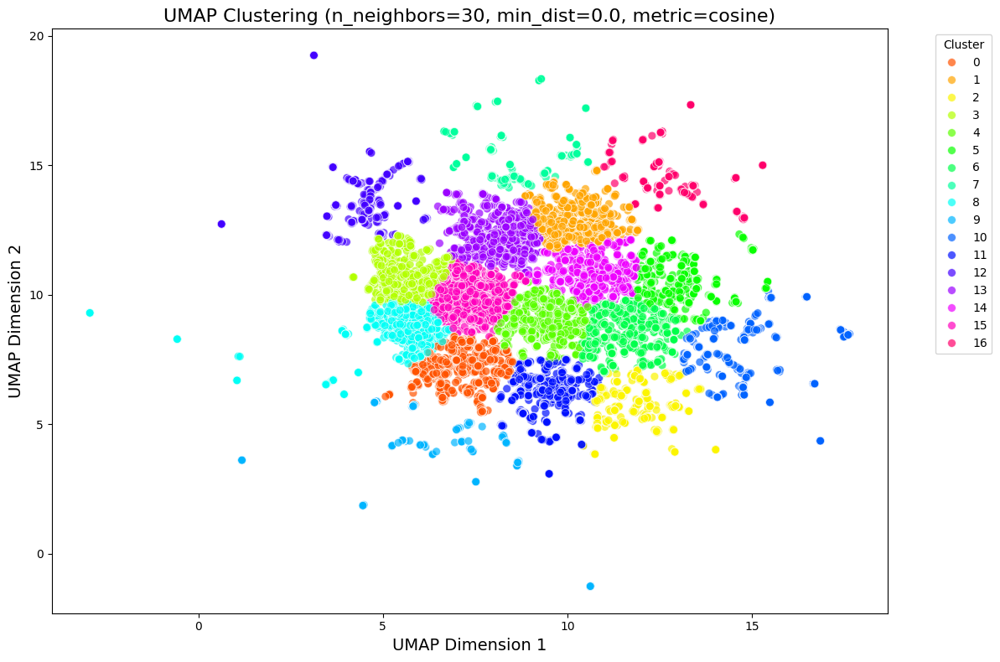

Clustering plot saved to best_umap_clustering.png
Best models saved as best_umap_model.pkl, best_kmeans_model.pkl, and best_vectorizer.pkl
Best embeddings saved to clean_embedding_df.csv


In [1]:
import pandas as pd
import json
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import umap
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import itertools
import warnings

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

def load_data(serialized=True):
    """
    Load preprocessed data from CSV files.
    
    Parameters:
        serialized (bool): Whether to load the serialized ingredients.
    
    Returns:
        pd.DataFrame: Cleaned recipes dataframe.
    """
    try:
        if serialized:
            # Load serialized ingredients
            clean_recipes_df = pd.read_csv('clean_recipes_df_serialized.csv')
            # Deserialize the ingredients column
            clean_recipes_df['ingredients'] = clean_recipes_df['ingredients'].apply(json.loads)
        else:
            # Load ingredients as lists directly (if already saved correctly)
            clean_recipes_df = pd.read_csv('clean_recipes_df.csv')
            # Parse the ingredients column if necessary
            import ast
            clean_recipes_df['ingredients'] = clean_recipes_df['ingredients'].apply(
                lambda x: ast.literal_eval(x) if isinstance(x, str) else x
            )
        return clean_recipes_df
    except FileNotFoundError as e:
        print(f"Data file not found: {e}")
        exit(1)
    except Exception as e:
        print(f"An error occurred while loading data: {e}")
        exit(1)

def feature_engineering(clean_recipes_df):
    """
    Convert ingredients to a binary matrix using CountVectorizer.
    
    Parameters:
        clean_recipes_df (pd.DataFrame): Cleaned recipes dataframe.
    
    Returns:
        tuple: (Feature matrix, CountVectorizer object)
    """
    from sklearn.feature_extraction.text import CountVectorizer
    
    clean_recipes_df['ingredients_str'] = clean_recipes_df['ingredients'].apply(lambda x: ' '.join(x))
    vectorizer = CountVectorizer()
    X = vectorizer.fit_transform(clean_recipes_df['ingredients_str'])
    return X, vectorizer

def perform_grid_search(X_scaled, n_clusters, hyperparameter_grid):
    """
    Perform grid search over UMAP hyperparameters to find the best combination.
    
    Parameters:
        X_scaled (sparse matrix): Scaled feature matrix.
        n_clusters (int): Number of clusters for KMeans.
        hyperparameter_grid (list): List of tuples containing hyperparameter combinations.
    
    Returns:
        dict: Best hyperparameters and corresponding models.
    """
    best_score = -1
    best_params = None
    best_embedding = None
    best_kmeans = None
    
    for n_neighbors, min_dist, metric in hyperparameter_grid:
        # Initialize UMAP with current hyperparameters
        umap_model = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, metric=metric, random_state=42)
        embedding = umap_model.fit_transform(X_scaled)
        
        # Apply KMeans clustering
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        clusters = kmeans.fit_predict(embedding)
        
        # Calculate Silhouette Score
        score = silhouette_score(embedding, clusters)
        
        print(f"n_neighbors: {n_neighbors}, min_dist: {min_dist}, metric: {metric}, Silhouette Score: {score:.4f}")
        
        # Update best parameters if current score is better
        if score > best_score:
            best_score = score
            best_params = {'n_neighbors': n_neighbors, 'min_dist': min_dist, 'metric': metric}
            best_embedding = embedding
            best_kmeans = kmeans
    
    print(f"\nBest Parameters: {best_params}, Best Silhouette Score: {best_score:.4f}")
    
    return {
        'best_params': best_params,
        'best_embedding': best_embedding,
        'best_kmeans': best_kmeans,
        'best_score': best_score
    }

def plot_clustering(embedding, labels, params, save_path='best_umap_clustering.png'):
    """
    Plot the UMAP embedding with clusters.
    
    Parameters:
        embedding (array): UMAP embeddings.
        labels (array): Cluster labels.
        params (dict): Hyperparameters used.
        save_path (str): File path to save the plot.
    """
    plt.figure(figsize=(12, 8))
    palette = sns.color_palette("hsv", len(set(labels)))
    sns.scatterplot(
        x=embedding[:,0],
        y=embedding[:,1],
        hue=labels,
        palette=palette,
        legend='full',
        s=50,
        alpha=0.7
    )
    plt.title(f'UMAP Clustering (n_neighbors={params["n_neighbors"]}, min_dist={params["min_dist"]}, metric={params["metric"]})', fontsize=16)
    plt.xlabel('UMAP Dimension 1', fontsize=14)
    plt.ylabel('UMAP Dimension 2', fontsize=14)
    plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    print(f"Clustering plot saved to {save_path}")

def save_best_models(umap_model, kmeans_model, vectorizer, save_prefix='best'):
    """
    Save the best UMAP model, KMeans model, and CountVectorizer.
    
    Parameters:
        umap_model (UMAP object): Trained UMAP model.
        kmeans_model (KMeans object): Trained KMeans model.
        vectorizer (CountVectorizer object): Fitted CountVectorizer.
        save_prefix (str): Prefix for saved files.
    """
    with open(f'{save_prefix}_umap_model.pkl', 'wb') as f:
        pickle.dump(umap_model, f)
    with open(f'{save_prefix}_kmeans_model.pkl', 'wb') as f:
        pickle.dump(kmeans_model, f)
    with open(f'{save_prefix}_vectorizer.pkl', 'wb') as f:
        pickle.dump(vectorizer, f)
    print(f"Best models saved as {save_prefix}_umap_model.pkl, {save_prefix}_kmeans_model.pkl, and {save_prefix}_vectorizer.pkl")

def main():
    # Load data
    clean_recipes_df = load_data(serialized=True)
    
    # Feature engineering
    X, vectorizer = feature_engineering(clean_recipes_df)
    
    # Scale the feature matrix
    scaler = StandardScaler(with_mean=False)
    X_scaled = scaler.fit_transform(X)
    
    # Define number of clusters (e.g., number of unique cuisines)
    n_clusters = clean_recipes_df['cuisine'].nunique()
    print(f"Number of clusters (unique cuisines): {n_clusters}")
    
    # Define hyperparameter grid for UMAP
    n_neighbors_options = [5, 10, 15, 20,30,45,75]
    min_dist_options = [0.0, 0.1, 0.2, 0.3,0.45]
    metric_options = ['euclidean', 'cosine']
    
    hyperparameter_grid = list(itertools.product(n_neighbors_options, min_dist_options, metric_options))
    
    # Perform grid search
    best_results = perform_grid_search(X_scaled, n_clusters, hyperparameter_grid)
    
    # Initialize UMAP with best parameters
    best_params = best_results['best_params']
    best_embedding = best_results['best_embedding']
    best_kmeans = best_results['best_kmeans']
    
    umap_model = umap.UMAP(n_neighbors=best_params['n_neighbors'],
                           min_dist=best_params['min_dist'],
                           metric=best_params['metric'],
                           random_state=42)
    
    # Refit UMAP to get the model (if needed)
    # umap_model.fit(X_scaled)
    
    # Plot the best clustering
    plot_clustering(best_embedding, best_kmeans.labels_, best_params, save_path='best_umap_clustering.png')
    
    # Save the best models and vectorizer
    save_best_models(umap_model, best_kmeans, vectorizer, save_prefix='best')
    
    # Save the best embeddings to CSV for use in Streamlit app
    merged_embedding_df = clean_recipes_df[['id']].copy()
    merged_embedding_df[['UMAP1', 'UMAP2']] = best_embedding
    merged_embedding_df.to_csv('clean_embedding_df.csv', index=False)
    print("Best embeddings saved to clean_embedding_df.csv")

if __name__ == "__main__":
    main()


In [2]:
import pandas as pd
import json
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import pairwise_distances
import umap
import numpy as np
import pickle
import random
import warnings
import itertools

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")


def load_data(serialized=True):
    """
    Load preprocessed data from CSV files.
    
    Parameters:
        serialized (bool): Whether to load the serialized ingredients.
    
    Returns:
        pd.DataFrame: Cleaned recipes dataframe.
    """
    try:
        if serialized:
            # Load serialized ingredients
            clean_recipes_df = pd.read_csv('clean_recipes_df_serialized.csv')
            # Deserialize the ingredients column
            clean_recipes_df['ingredients'] = clean_recipes_df['ingredients'].apply(json.loads)
        else:
            # Load ingredients as lists directly (if already saved correctly)
            clean_recipes_df = pd.read_csv('clean_recipes_df.csv')
            # Parse the ingredients column if necessary
            import ast
            clean_recipes_df['ingredients'] = clean_recipes_df['ingredients'].apply(
                lambda x: ast.literal_eval(x) if isinstance(x, str) else x
            )
        return clean_recipes_df
    except FileNotFoundError as e:
        print(f"Data file not found: {e}")
        exit(1)
    except Exception as e:
        print(f"An error occurred while loading data: {e}")
        exit(1)


def feature_engineering(clean_recipes_df):
    """
    Convert ingredients to a binary matrix using CountVectorizer.
    
    Parameters:
        clean_recipes_df (pd.DataFrame): Cleaned recipes dataframe.
    
    Returns:
        tuple: (Feature matrix, CountVectorizer object)
    """
    from sklearn.feature_extraction.text import CountVectorizer

    clean_recipes_df['ingredients_str'] = clean_recipes_df['ingredients'].apply(lambda x: ' '.join(x))
    vectorizer = CountVectorizer()
    X = vectorizer.fit_transform(clean_recipes_df['ingredients_str'])
    return X, vectorizer


def compute_nearest_neighbors_preservation(X_original, X_embedded, n_neighbors=10):
    """
    Compute the nearest neighbor preservation score for UMAP embeddings.
    
    Parameters:
        X_original (array): Original high-dimensional feature matrix.
        X_embedded (array): Low-dimensional UMAP embeddings.
        n_neighbors (int): Number of neighbors to consider.
    
    Returns:
        float: Nearest neighbor preservation ratio.
    """
    nn_original = NearestNeighbors(n_neighbors=n_neighbors).fit(X_original)
    nn_embedded = NearestNeighbors(n_neighbors=n_neighbors).fit(X_embedded)

    # Get nearest neighbors for original and embedded spaces
    original_distances, original_indices = nn_original.kneighbors(X_original)
    embedded_distances, embedded_indices = nn_embedded.kneighbors(X_embedded)

    # Compute preservation by checking overlap in nearest neighbors
    overlaps = [
        len(set(original_indices[i]).intersection(set(embedded_indices[i]))) / n_neighbors
        for i in range(len(X_original))
    ]
    return np.mean(overlaps)  # Return average overlap


def perform_randomized_search(X_scaled, param_grid, n_trials=10):
    """
    Perform randomized search over UMAP hyperparameters.
    
    Parameters:
        X_scaled (sparse matrix): Scaled feature matrix.
        param_grid (list): List of tuples containing hyperparameter combinations.
        n_trials (int): Number of random trials.
    
    Returns:
        dict: Best hyperparameters and corresponding models.
    """
    best_score = -1
    best_params = None
    best_embedding = None
    
    # Randomly sample hyperparameters
    for _ in range(n_trials):
        # Sample random hyperparameters
        n_neighbors, min_dist, metric = random.choice(param_grid)
        
        # Initialize UMAP with current hyperparameters
        umap_model = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, metric=metric, random_state=42)
        embedding = umap_model.fit_transform(X_scaled)
        
        # Compute Nearest Neighbor preservation score
        score = compute_nearest_neighbors_preservation(X_scaled, embedding, n_neighbors=n_neighbors)
        
        print(f"n_neighbors: {n_neighbors}, min_dist: {min_dist}, metric: {metric}, NN Preservation Score: {score:.4f}")
        
        # Update best parameters if current score is better
        if score > best_score:
            best_score = score
            best_params = {'n_neighbors': n_neighbors, 'min_dist': min_dist, 'metric': metric}
            best_embedding = embedding
    
    print(f"\nBest Parameters: {best_params}, Best NN Preservation Score: {best_score:.4f}")
    
    return {
        'best_params': best_params,
        'best_embedding': best_embedding,
        'best_score': best_score
    }


def save_best_models(umap_model, vectorizer, save_prefix='best'):
    """
    Save the best UMAP model and CountVectorizer.
    
    Parameters:
        umap_model (UMAP object): Trained UMAP model.
        vectorizer (CountVectorizer object): Fitted CountVectorizer.
        save_prefix (str): Prefix for saved files.
    """
    with open(f'{save_prefix}_umap_model.pkl', 'wb') as f:
        pickle.dump(umap_model, f)
    with open(f'{save_prefix}_vectorizer.pkl', 'wb') as f:
        pickle.dump(vectorizer, f)
    print(f"Best models saved as {save_prefix}_umap_model.pkl and {save_prefix}_vectorizer.pkl")


def main():
    # Load data
    clean_recipes_df = load_data(serialized=True)
    
    # Feature engineering
    X, vectorizer = feature_engineering(clean_recipes_df)
    
    # Scale the feature matrix
    scaler = StandardScaler(with_mean=False)
    X_scaled = scaler.fit_transform(X)
    
    # Define hyperparameter grid for UMAP
    n_neighbors_options = [5, 10, 15, 20]
    min_dist_options = [0.0, 0.1, 0.2, 0.3]
    metric_options = ['euclidean', 'cosine']
    
    param_grid = list(itertools.product(n_neighbors_options, min_dist_options, metric_options))
    
    # Perform randomized search
    best_results = perform_randomized_search(X_scaled, param_grid, n_trials=20)
    
    # Initialize UMAP with best parameters
    best_params = best_results['best_params']
    best_embedding = best_results['best_embedding']
    
    umap_model = umap.UMAP(n_neighbors=best_params['n_neighbors'],
                           min_dist=best_params['min_dist'],
                           metric=best_params['metric'],
                           random_state=42)
    
    # Refit UMAP to get the model
    umap_model.fit(X_scaled)
    
    # Save the best models and vectorizer
    save_best_models(umap_model, vectorizer, save_prefix='best')
    
    # Save the best embeddings to CSV for use in Streamlit app
    merged_embedding_df = clean_recipes_df[['id']].copy()
    merged_embedding_df[['UMAP1', 'UMAP2']] = best_embedding
    merged_embedding_df.to_csv('clean_embedding_df.csv', index=False)
    print("Best embeddings saved to clean_embedding_df.csv")


if __name__ == "__main__":
    main()


TypeError: sparse array length is ambiguous; use getnnz() or shape[0]